# Community Detection
### Mini-project for Massive Graph Management and Analytics

---

**Authors:** Olha Baliasina, Samuel Chapuis

---

## Table of Contents

1. [Introduction & Dataset Description](#1-introduction)
2. [Setup & Data Loading](#2-setup)
3. [Exploratory Data Analysis (EDA)](#3-eda)
4. [Network Visualization](#4-visualization)
5. [Centrality Analysis](#5-centrality)
6. [Ground-Truth Communities Analysis](#6-ground-truth)
7. [Community Detection: Louvain Algorithm](#7-louvain)
8. [Community Detection: Walktrap Algorithm](#8-walktrap)
9. [Algorithm Comparison & Evaluation](#9-comparison)
10. [Key Findings & Interpretations](#10-findings)
11. [Conclusion](#11-conclusion)

---
# PART 1. 
### Dataset: Amazon Product Co-Purchasing Network

---
## 1. Introduction & Dataset Description <a id='1-introduction'></a>


**What is this network?**

This network represents product co-purchasing relationships on Amazon. It was collected by crawling the Amazon website and is based on the "Customers Who Bought This Item Also Bought" feature.

**Network Structure:**
- **Nodes:** Products on Amazon (334,863 products)
- **Edges:** Co-purchasing relationships (925,872 edges)
- **Type:** Undirected graph
- **Edge meaning:** If product *i* is frequently co-purchased with product *j*, there is an undirected edge between them

**Ground-Truth Communities:**
- Each product category provided by Amazon defines a ground-truth community
- Products can belong to multiple categories (overlapping communities)
- Total of 75,149 ground-truth communities

**Why is this network interesting for community detection?**
1. **Real-world relevance:** Understanding product communities can improve recommendation systems
2. **Ground-truth available:** We can evaluate our detected communities against actual product categories
3. **Scale:** Large enough to be challenging, but tractable for analysis
4. **Business applications:** Results can inform marketing, inventory, and product placement strategies

**Data Sources:**
- Network: [SNAP Amazon Co-Purchasing Network](https://snap.stanford.edu/data/com-Amazon.html)
- Paper: [Defining and Evaluating Network Communities (Leskovec et al., 2012)](https://arxiv.org/pdf/1205.6233)

**How to use the data:**
1. Download `com-amazon.ungraph.txt.gz` and `com-amazon.all.dedup.cmty.txt.gz` from the SNAP website
2. Extract the files to a `data/` folder in the same directory as this notebook
3. Install dependencies from requirements.txt
4. Run the cells below

---
## 2. Setup & Data Loading <a id='2-setup'></a>

In [1]:
import networkx as nx
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter, defaultdict, deque
import time
import community.community_louvain as community_louvain
import igraph as ig
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score
import ast
import pickle
from itertools import combinations
from networkx.algorithms import community as nx_community

plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('husl')
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

### 2.1 Loading the Graph Data

In [2]:
GRAPH_FILE = 'data/com-amazon.ungraph.txt'
COMMUNITY_FILE = 'data/com-amazon.all.dedup.cmty.txt'

print("Loading Amazon co-purchasing network...")
start_time = time.time()

G = nx.read_edgelist(
    GRAPH_FILE, 
    comments='#',
    delimiter='\t',
    create_using=nx.Graph(),
    nodetype=int
)

load_time = time.time() - start_time
print(f"Graph loaded in {load_time:.2f} seconds")
print(f"Nodes: {G.number_of_nodes():,}")
print(f"Edges: {G.number_of_edges():,}")

Loading Amazon co-purchasing network...
Graph loaded in 1.57 seconds
Nodes: 334,863
Edges: 925,872


The Amazon co-purchasing network has **334,863 nodes** and **925,872 edges**, which is too large to visualise directly and makes some algorithms (especially those based on all-pairs shortest paths) very expensive.

To handle this, I use two levels of analysis:

- On the **full graph**, I compute:
  - basic statistics (e.g. size, density),
  - degree distribution and clustering,
  - PageRank and local clustering coefficients for all nodes,
  - community detection with k-core, Louvain and Walktrap.

- On a **sampled subgraph** of about 3,000 nodes (induced by a BFS sample), I:
  - draw visualisations of the network,
  - compute more expensive measures like betweenness and closeness centrality,
  - illustrate the relationships between different centralities.



### 2.2 Loading Ground-Truth Communities

In [3]:
print("Loading ground-truth communities...")

ground_truth_communities = []

with open(COMMUNITY_FILE, 'r') as f:
    for line in f:
        line = line.strip()
        if line and not line.startswith('#'):
            members = [int(x) for x in line.split('\t')]
            ground_truth_communities.append(set(members))

print(f"Loaded {len(ground_truth_communities):,} ground-truth communities")

# Basic statistics
community_sizes = [len(c) for c in ground_truth_communities]
print(f"\nGround-truth community size statistics:")
print(f"  Min size: {min(community_sizes)}")
print(f"  Max size: {max(community_sizes):,}")
print(f"  Mean size: {np.mean(community_sizes):.2f}")
print(f"  Median size: {np.median(community_sizes):.2f}")

Loading ground-truth communities...
Loaded 75,149 ground-truth communities

Ground-truth community size statistics:
  Min size: 3
  Max size: 53,551
  Mean size: 30.23
  Median size: 5.00


---
## 3. Exploratory Data Analysis (EDA) <a id='3-eda'></a>

Before performing community detection, we need to understand the structure of our network.

### 3.1 Basic Network Statistics

In [4]:
def compute_basic_stats(G):
    stats = {}

    stats["num_nodes"] = G.number_of_nodes()
    stats["num_edges"] = G.number_of_edges()
    stats["density"] = nx.density(G)

    degrees = [d for _, d in G.degree()]
    stats["avg_degree"] = float(np.mean(degrees))
    stats["median_degree"] = float(np.median(degrees))
    stats["min_degree"] = int(np.min(degrees))
    stats["max_degree"] = int(np.max(degrees))
    stats["std_degree"] = float(np.std(degrees))

    components = list(nx.connected_components(G))
    stats["num_connected_components"] = len(components)
    largest_cc = max(components, key=len)
    stats["largest_cc_size"] = len(largest_cc)
    stats["largest_cc_ratio"] = stats["largest_cc_size"] / stats["num_nodes"]

    stats["num_self_loops"] = nx.number_of_selfloops(G)
    stats["num_isolates"] = nx.number_of_isolates(G)

    return stats, degrees


print("Computing basic network statistics...")
start_time = time.time()
stats, degrees = compute_basic_stats(G)
elapsed = time.time() - start_time
print(f"Done in {elapsed:.2f} seconds.\n")

print("Basic statistics for the Amazon co-purchasing graph")
print("---------------------------------------------------")
print(f"Nodes (products):          {stats['num_nodes']:,}")
print(f"Edges (co-purchases):      {stats['num_edges']:,}")
print(f"Density:                   {stats['density']:.8f}")
print(f"Average degree:            {stats['avg_degree']:.2f}")
print(f"Median degree:             {stats['median_degree']:.2f}")
print(f"Min degree:                {stats['min_degree']}")
print(f"Max degree:                {stats['max_degree']:,}")
print(f"Degree std dev:            {stats['std_degree']:.2f}")
print(f"Connected components:      {stats['num_connected_components']}")
print(f"Largest component size:    {stats['largest_cc_size']:,}")
print(f"Largest component ratio:   {stats['largest_cc_ratio']:.2%}")
print(f"Self-loops:                {stats['num_self_loops']}")
print(f"Isolated nodes:            {stats['num_isolates']}")


Computing basic network statistics...
Done in 0.70 seconds.

Basic statistics for the Amazon co-purchasing graph
---------------------------------------------------
Nodes (products):          334,863
Edges (co-purchases):      925,872
Density:                   0.00001651
Average degree:            5.53
Median degree:             4.00
Min degree:                1
Max degree:                549
Degree std dev:            5.76
Connected components:      1
Largest component size:    334,863
Largest component ratio:   100.00%
Self-loops:                0
Isolated nodes:            0


---

### 3.2 Degree Distribution Analysis

The degree distribution tells us how connections are distributed across products. 

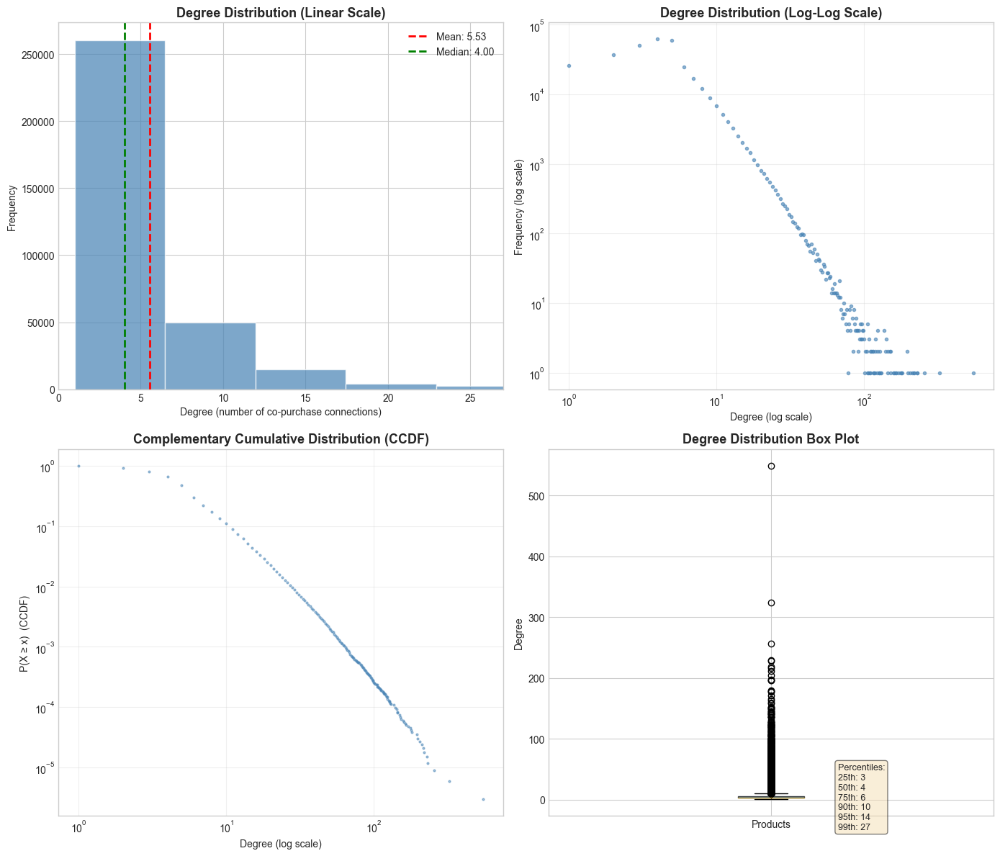

In [5]:
degrees_arr = np.array(degrees)

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# 1. Histogram (linear scale)
ax1 = axes[0, 0]
cutoff = np.percentile(degrees_arr, 99)
ax1.hist(degrees_arr, bins=100, color="steelblue", edgecolor="white", alpha=0.7)
ax1.axvline(stats["avg_degree"], color="red", linestyle="--", linewidth=2,
            label=f"Mean: {stats['avg_degree']:.2f}")
ax1.axvline(stats["median_degree"], color="green", linestyle="--", linewidth=2,
            label=f"Median: {stats['median_degree']:.2f}")
ax1.set_xlabel("Degree (number of co-purchase connections)")
ax1.set_ylabel("Frequency")
ax1.set_title("Degree Distribution (Linear Scale)", fontsize=13, fontweight="bold")
ax1.legend()
ax1.set_xlim(0, cutoff)

# 2. Log–log degree distribution
ax2 = axes[0, 1]
degree_counts = Counter(degrees_arr)
deg_vals = sorted(degree_counts.keys())
freq_vals = [degree_counts[d] for d in deg_vals]
ax2.loglog(deg_vals, freq_vals, "o", markersize=3, alpha=0.6, color="steelblue")
ax2.set_xlabel("Degree (log scale)")
ax2.set_ylabel("Frequency (log scale)")
ax2.set_title("Degree Distribution (Log-Log Scale)", fontsize=13, fontweight="bold")
ax2.grid(True, alpha=0.3)

# 3. CCDF
ax3 = axes[1, 0]
vals, counts = np.unique(degrees_arr, return_counts=True)
ccdf = 1 - np.cumsum(counts) / len(degrees_arr) + counts / len(degrees_arr)
ax3.loglog(vals, ccdf, "o", markersize=2, alpha=0.5, color="steelblue")
ax3.set_xlabel("Degree (log scale)")
ax3.set_ylabel("P(X ≥ x)  (CCDF)")
ax3.set_title("Complementary Cumulative Distribution (CCDF)", fontsize=13, fontweight="bold")
ax3.grid(True, alpha=0.3)

# 4. Boxplot + percentiles
ax4 = axes[1, 1]
bp = ax4.boxplot(degrees_arr, vert=True, patch_artist=True)
bp["boxes"][0].set_facecolor("steelblue")
bp["boxes"][0].set_alpha(0.7)

percentiles = [25, 50, 75, 90, 95, 99]
perc_vals = np.percentile(degrees_arr, percentiles)
text = "\n".join([f"{p}th: {v:.0f}" for p, v in zip(percentiles, perc_vals)])

ax4.text(
    1.15,
    np.median(degrees_arr),
    f"Percentiles:\n{text}",
    fontsize=9,
    va="center",
    bbox=dict(boxstyle="round", facecolor="wheat", alpha=0.5),
)
ax4.set_ylabel("Degree")
ax4.set_title("Degree Distribution Box Plot", fontsize=13, fontweight="bold")
ax4.set_xticklabels(["Products"])

plt.tight_layout()
plt.savefig("degree_distribution.png", dpi=150, bbox_inches="tight")
plt.show()


The plots above show how the number of co-purchase connections (degree) is distributed
over products.

**Main statistics:**

- Mean degree ≈ 5.5
- Median degree = 4
- 75% of nodes have degree ≤ 6
- 90% of nodes have degree ≤ 10
- 99% of nodes have degree ≤ ~27
- A few extreme hubs reach degrees above 500

**Top-left: linear histogram**

Most products have **very low degree** (between 1 and 10 co-purchase neighbors).  
The mean is slightly higher than the median, which already suggests a **skewed distribution**
with some high-degree outliers pulling the average up.

**Top-right: log–log degree distribution**

On the log–log plot we see:

- Many nodes with small degree
- A long, slowly decaying tail for large degrees

The points roughly follow a **straight-ish line** in the tail, which is typical of a
*heavy-tailed* or **approximately power-law** degree distribution. This means there are
a few very highly connected “hub” products and many products with only a few connections.

**Bottom-left: CCDF**

The CCDF plot shows \(P(X >= x)\), the probability that a product has degree at least \(x\).

- For small \(x\), the probability is still quite high.
- As x increases, the CCDF decreases slowly rather than dropping sharply, confirming
  that the tail is heavy: high-degree nodes are rare, but not *impossibly* rare.

**Bottom-right: boxplot**

The boxplot highlights:

- A very small interquartile range (between degrees 3 and 6),
- A large number of outliers above the upper whisker, corresponding to hub products
  with tens or hundreds of neighbors.

Overall, the degree distribution is **highly skewed and heavy-tailed**:
the Amazon co-purchase network is dominated by many low-degree products and a small
number of very popular hub products.


---
For community detection, I will work with the largest connected component (LCC), but in this network it consists of the whole graph.

### 3.3 Additional Network Properties

In [6]:
print("Extra network properties on the largest connected component")
print("-----------------------------------------------------------")

rng = np.random.default_rng(42)

# clustering
t0 = time.time()

if G.number_of_nodes() > 100000:
    sample_nodes = rng.choice(list(G.nodes()), size=10000, replace=False)
    clust_vals = nx.clustering(G, nodes=sample_nodes)
    avg_clustering = float(np.mean(list(clust_vals.values())))
    print(f"Average clustering (sample of 10k nodes): {avg_clustering:.4f}")
else:
    avg_clustering = nx.average_clustering(G)
    print(f"Average clustering (full graph):         {avg_clustering:.4f}")

print(f"Time for clustering:                      {time.time() - t0:.2f} s")

# transitivity (global clustering)
t0 = time.time()
transitivity = nx.transitivity(G)
print(f"Transitivity (global clustering):         {transitivity:.4f}")
print(f"Time for transitivity:                    {time.time() - t0:.2f} s")

# approximate average shortest path length
t0 = time.time()
nodes_lcc = list(G.nodes())
num_sources = min(200, len(nodes_lcc))   # number of BFS sources
sources = rng.choice(nodes_lcc, size=num_sources, replace=False)

dists = []
for s in sources:
    lengths = nx.single_source_shortest_path_length(G, s)
    dists.extend(lengths.values())

avg_path_length = float(np.mean(dists))
print(f"Estimated average shortest path length:   {avg_path_length:.2f}")
print(f"Time for path length estimation:          {time.time() - t0:.2f} s")

print()
print("Interpretation:")
print(f"- Average clustering ≈ {avg_clustering:.4f}: neighbours of a product are often")
print("  connected to each other, so we have many small tightly-knit groups.")
print(f"- Transitivity ≈ {transitivity:.4f}: confirms strong global clustering.")
print(f"- Average shortest path ≈ {avg_path_length:.1f}: most products are only a few")
print("  hops apart, which is a typical small-world behaviour.")


Extra network properties on the largest connected component
-----------------------------------------------------------
Average clustering (sample of 10k nodes): 0.3975
Time for clustering:                      0.13 s
Transitivity (global clustering):         0.2052
Time for transitivity:                    3.13 s
Estimated average shortest path length:   12.11
Time for path length estimation:          58.60 s

Interpretation:
- Average clustering ≈ 0.3975: neighbours of a product are often
  connected to each other, so we have many small tightly-knit groups.
- Transitivity ≈ 0.2052: confirms strong global clustering.
- Average shortest path ≈ 12.1: most products are only a few
  hops apart, which is a typical small-world behaviour.


---
## 4. Network Visualization <a id='4-visualization'></a>

Visualizing the full network (334K nodes) is impractical. We'll use sampling strategies.

### 4.1 Sample Subgraph for Visualization

In [7]:
def sample_subgraph(G, n_nodes=3000, method="bfs", seed=42):
    rng = np.random.default_rng(seed)
    n_nodes = min(n_nodes, G.number_of_nodes())
    all_nodes = list(G.nodes())

    if method == "bfs":
        # breadth-first expansion from a random start node
        start = rng.choice(all_nodes)
        visited = {start}
        q = deque([start])

        while q and len(visited) < n_nodes:
            u = q.popleft()
            for v in G.neighbors(u):
                if v not in visited:
                    visited.add(v)
                    q.append(v)
                    if len(visited) >= n_nodes:
                        break
        return G.subgraph(visited).copy()

    elif method == "random_walk":
        current = rng.choice(all_nodes)
        sampled = {current}

        while len(sampled) < n_nodes:
            neighbors = list(G.neighbors(current))
            if neighbors:
                current = rng.choice(neighbors)
            else:
                current = rng.choice(all_nodes)
            sampled.add(current)
        return G.subgraph(sampled).copy()

    else:  # uniform random nodes
        picked = rng.choice(all_nodes, size=n_nodes, replace=False)
        return G.subgraph(picked).copy()


print("Sampling subgraph for visualisation...")
G_sample = sample_subgraph(G, n_nodes=3000, method="bfs", seed=42)
print(f"Subgraph: {G_sample.number_of_nodes()} nodes, {G_sample.number_of_edges()} edges")


Sampling subgraph for visualisation...
Subgraph: 3000 nodes, 6469 edges



I decided to use a **BFS-based sample** from the largest connected
component:

- I pick a random start node.
- Then I do a breadth-first search, gradually adding neighbours until I reach
  the target number of nodes (about 3000).

This has a couple of advantages compared to just picking random nodes:

- It keeps the **local structure** of the graph: neighbours in the sample are
  often real neighbours in the original network, so paths and small
  communities look more realistic.
- It avoids ending up with many **isolated nodes** that are not connected to
  each other in the sample, which would make the visualisation useless.

I also kept the option to sample by **random walk** or **uniform random nodes**
in the function, but for the main analysis I use the BFS sample
because it better preserves the local connectivity pattern of the original
graph.

### 4.2 Visualize Sample Network

Computing layout (this may take a moment)...


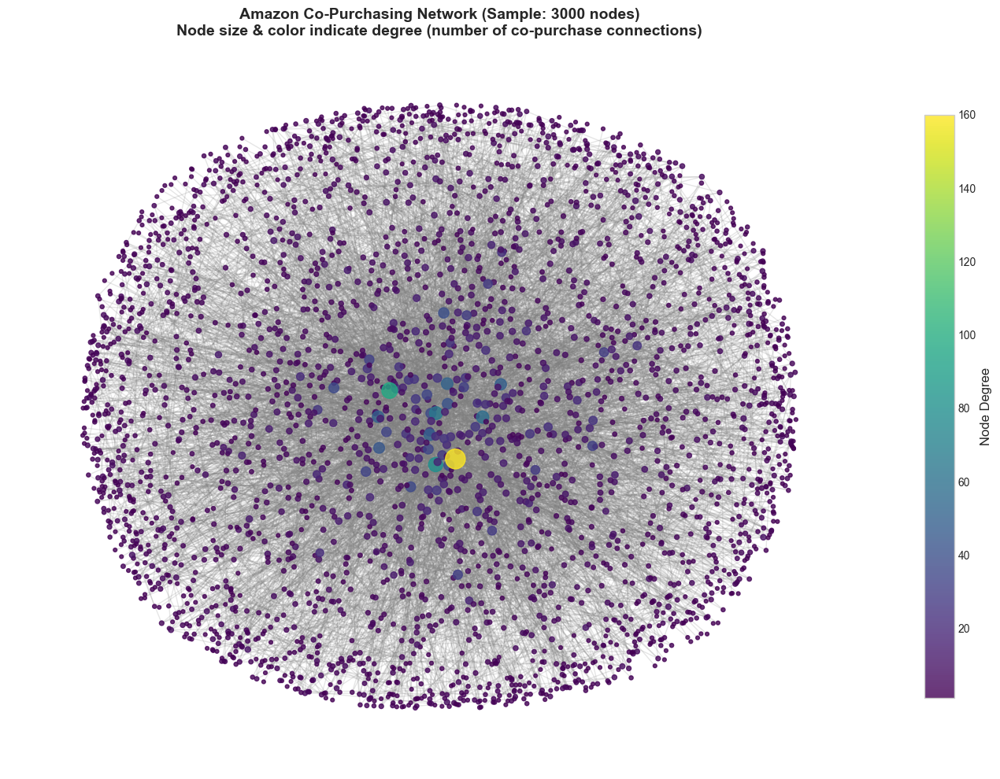


Visualization saved as 'network_visualization.png'


In [11]:
fig, ax = plt.subplots(figsize=(14, 10))
print("Computing layout (this may take a moment)...")
pos = nx.spring_layout(G_sample, k=0.3, iterations=50, seed=42)

# Node sizes based on degree
degrees_sample = dict(G_sample.degree())
node_sizes = [10 + degrees_sample[n] * 2 for n in G_sample.nodes()]

# Node colors based on degree
node_colors = [degrees_sample[n] for n in G_sample.nodes()]

nx.draw_networkx_edges(G_sample, pos, alpha=0.2, edge_color='gray', ax=ax)
nodes = nx.draw_networkx_nodes(G_sample, pos, 
                               node_size=node_sizes, 
                               node_color=node_colors,
                               cmap=plt.cm.viridis,
                               alpha=0.8,
                               ax=ax)

# Add colorbar
cbar = plt.colorbar(nodes, ax=ax, shrink=0.8)
cbar.set_label('Node Degree', fontsize=12)

ax.set_title('Amazon Co-Purchasing Network (Sample: 3000 nodes)\n'
             'Node size & color indicate degree (number of co-purchase connections)',
             fontsize=14, fontweight='bold')
ax.axis('off')

plt.tight_layout()
plt.savefig('network_visualization.png', dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

print("\nVisualization saved as 'network_visualization.png'")

To better visualize the connections, I created an even smaller sample of just 300 nodes:

In [12]:
print("Sampling subgraph for visualisation...")
G_sample_tiny = sample_subgraph(G, n_nodes=300, method="bfs", seed=42)
print(f"Subgraph: {G_sample_tiny.number_of_nodes()} nodes, {G_sample_tiny.number_of_edges()} edges")


Sampling subgraph for visualisation...
Subgraph: 300 nodes, 702 edges


Computing layout (this may take a moment)...


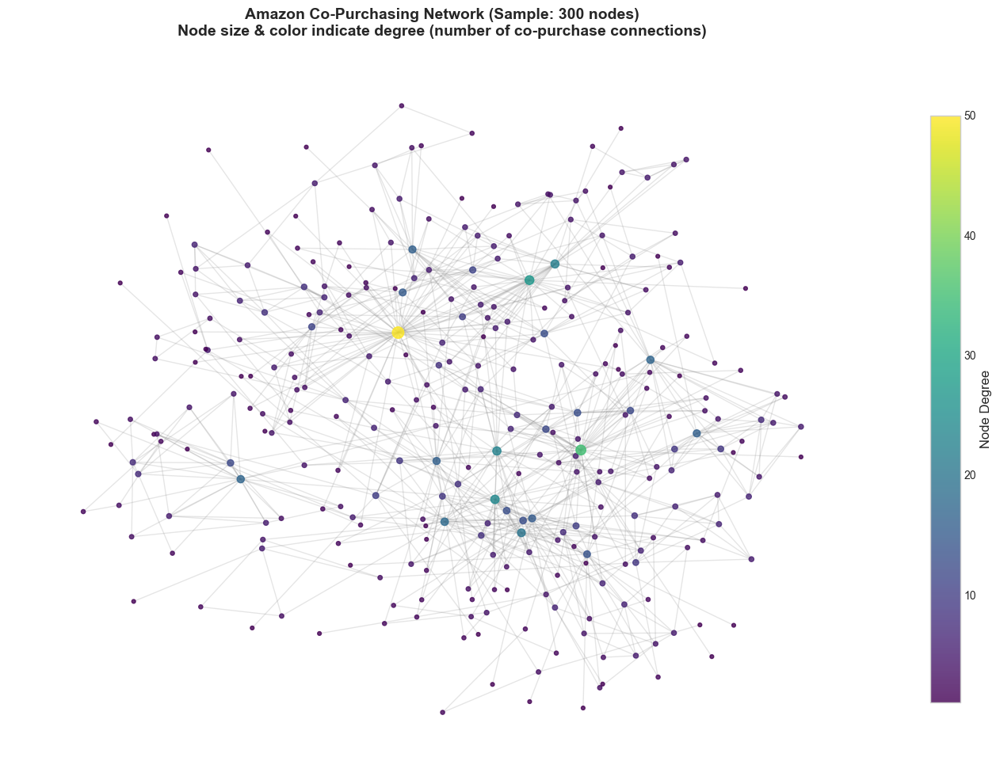


Visualization saved as 'network_visualization_tiny_subset.png'


In [13]:
fig, ax = plt.subplots(figsize=(14, 10))
print("Computing layout (this may take a moment)...")
pos = nx.spring_layout(G_sample_tiny, k=0.3, iterations=50, seed=42)

# Node sizes based on degree
degrees_sample = dict(G_sample_tiny.degree())
node_sizes = [10 + degrees_sample[n] * 2 for n in G_sample_tiny.nodes()]

# Node colors based on degree
node_colors = [degrees_sample[n] for n in G_sample_tiny.nodes()]

nx.draw_networkx_edges(G_sample_tiny, pos, alpha=0.2, edge_color='gray', ax=ax)
nodes = nx.draw_networkx_nodes(G_sample_tiny, pos, 
                               node_size=node_sizes, 
                               node_color=node_colors,
                               cmap=plt.cm.viridis,
                               alpha=0.8,
                               ax=ax)

# Add colorbar
cbar = plt.colorbar(nodes, ax=ax, shrink=0.8)
cbar.set_label('Node Degree', fontsize=12)

ax.set_title('Amazon Co-Purchasing Network (Sample: 300 nodes)\n'
             'Node size & color indicate degree (number of co-purchase connections)',
             fontsize=14, fontweight='bold')
ax.axis('off')

plt.tight_layout()
plt.savefig('network_visualization_tiny_subset.png', dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

print("\nVisualization saved as 'network_visualization_tiny_subset.png'")

### 4.3 Ego Network Visualization

Next, we visualize the neighborhood of a high-degree (hub) product.

Hub node: 548091, degree: 549
1-hop ego: 550 nodes, 729 edges
2-hop ego: 1315 nodes, 2475 edges
2-hop ego used for plot: 1315 nodes


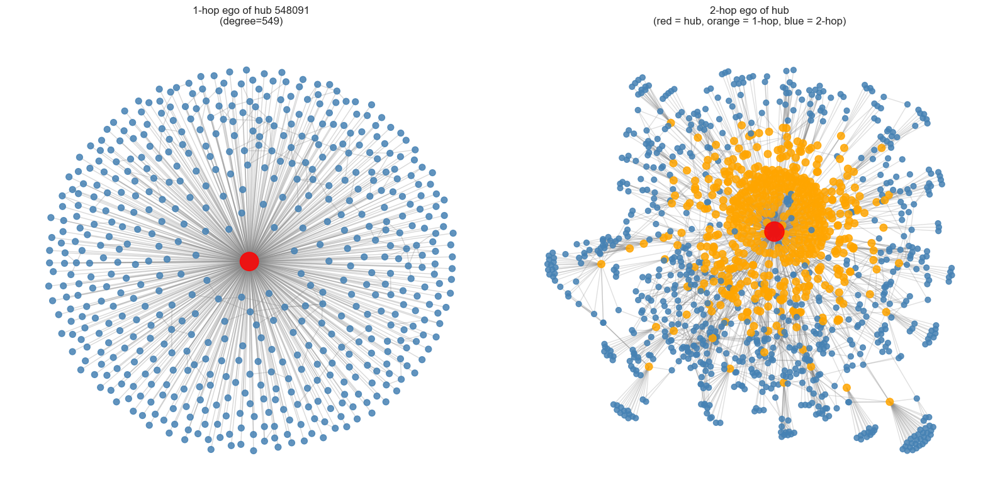

In [14]:
deg = dict(G.degree())
hub_node = max(deg, key=deg.get)
print(f"Hub node: {hub_node}, degree: {deg[hub_node]}")

# 1-hop ego
ego_1 = nx.ego_graph(G, hub_node, radius=1)
print(f"1-hop ego: {ego_1.number_of_nodes()} nodes, {ego_1.number_of_edges()} edges")

# 2-hop ego
ego_2 = nx.ego_graph(G, hub_node, radius=2)
print(f"2-hop ego: {ego_2.number_of_nodes()} nodes, {ego_2.number_of_edges()} edges")

max_plot_nodes = 3000
rng = np.random.default_rng(42)

if ego_2.number_of_nodes() > max_plot_nodes:
    nodes_2 = list(ego_2.nodes())
    one_hop_neigh = set(ego_1.nodes()) - {hub_node}
    rest = list(set(nodes_2) - one_hop_neigh - {hub_node})
    keep_rest = max_plot_nodes - 1 - len(one_hop_neigh)
    if keep_rest > 0 and len(rest) > 0:
        extra = rng.choice(rest, size=min(keep_rest, len(rest)), replace=False)
        sampled_nodes = {hub_node} | one_hop_neigh | set(extra)
    else:
        sampled_nodes = {hub_node} | one_hop_neigh
    ego_2_plot = ego_2.subgraph(sampled_nodes).copy()
else:
    ego_2_plot = ego_2

print(f"2-hop ego used for plot: {ego_2_plot.number_of_nodes()} nodes")

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

pos1 = nx.spring_layout(ego_1, seed=42)
colors1 = ["red" if n == hub_node else "steelblue" for n in ego_1.nodes()]
sizes1 = [450 if n == hub_node else 50 for n in ego_1.nodes()]

nx.draw_networkx_edges(ego_1, pos1, alpha=0.3, edge_color="gray", ax=axes[0])
nx.draw_networkx_nodes(ego_1, pos1, node_color=colors1, node_size=sizes1,
                       alpha=0.85, ax=axes[0])
axes[0].set_title(f"1-hop ego of hub {hub_node}\n(degree={deg[hub_node]})")
axes[0].axis("off")

pos2 = nx.spring_layout(ego_2_plot, seed=42)
colors2 = []
sizes2 = []
for n in ego_2_plot.nodes():
    if n == hub_node:
        colors2.append("red")
        sizes2.append(500)
    elif n in ego_1:
        colors2.append("orange")# 1-hop neighbours
        sizes2.append(70)
    else:
        colors2.append("steelblue")# 2-hop
        sizes2.append(40)

nx.draw_networkx_edges(ego_2_plot, pos2, alpha=0.25, edge_color="gray", ax=axes[1])
nx.draw_networkx_nodes(ego_2_plot, pos2, node_color=colors2, node_size=sizes2,
                       alpha=0.85, ax=axes[1])
axes[1].set_title("2-hop ego of hub\n(red = hub, orange = 1-hop, blue = 2-hop)")
axes[1].axis("off")

plt.tight_layout()
plt.savefig("ego_1_2_hop_side_by_side.png", dpi=150, bbox_inches="tight")
plt.show()


Here we look at the **ego network** of the node with the highest degree in the
full Amazon graph:

- the red node is the **hub product** (the product with the largest number of
  co-purchase neighbours),
- the blue nodes are all products that are directly connected to it (bought
  together with it at least once),
- edges show co-purchasing links inside this 1-hop neighbourhood.

We compare the 1-hop ego network (left) and a sampled 2-hop ego network (right)
of the same hub node. The 2-hop view shows how quickly the hub reaches a much
larger region of the graph, even though it is only two steps away.

This gives a local picture of how a very popular product “sits” in the network:
it has many neighbours, and some of those neighbours are also connected with
each other, but not all. So the hub is not just part of a tiny clique, it is a
connector that links many different products and likely many different
communities.

---
## 5. Centrality Analysis <a id='5-centrality'></a>

Centrality measures help identify the most "important" products in the network.

### 5.1 Compute Centrality Measures

We try several centrality measures, each capturing a different idea of "importance" in the network:

1. **Degree Centrality**  
   Products with the most direct co-purchase links  
   (popular items that are bought together with many others)

2. **PageRank**  
   Products that are connected to other important products  
   (a random walker on the graph is more likely to visit them)

3. **Betweenness Centrality**  
   Products that lie on many shortest paths between other products  
   (they act as bridges between different parts of the network)

4. **Eigenvector Centrality**  
   Products that are connected to other well-connected products  
   (being linked to “influential” items makes you influential too)

5. **Clustering Coefficient**  
   How much a product’s neighbours are connected to each other  
   (high values mean the product sits in a tightly-knit group/cluster)

6. **Closeness Centrality**  
   Products that are, on average, at short distance from all others  
   (they can “reach” the rest of the network in few steps)

7. **Harmonic Centrality**  
   Similar to closeness, but more robust when some nodes are far away  
   (gives more weight to close nodes, less to very distant ones)

8. **Katz Centrality**  
   Products that are close to many others through walks of different lengths  
   (counts not only direct neighbours, but also neighbours-of-neighbours, with a decay factor)

In [19]:
print("Centrality measures on the full graph")
print("--------------------------------------")

centrality = {}

# Degree centrality (normalized, uses degree / (n-1))
print("1) Degree centrality")
t0 = time.time()
centrality["degree"] = nx.degree_centrality(G)
print(f"   done in {time.time() - t0:.2f} s")

# PageRank
print("2) PageRank")
t0 = time.time()
centrality["pagerank"] = nx.pagerank(G, alpha=0.85, max_iter=100)
print(f"   done in {time.time() - t0:.2f} s")

# Betweenness (approximate)
print("3) Betweenness centrality (approximate)")
t0 = time.time()
k_samples = min(300, G.number_of_nodes())
centrality["betweenness"] = nx.betweenness_centrality(G, k=k_samples, seed=42)
print(f"   done in {time.time() - t0:.2f} s (k = {k_samples} sample nodes)")

# Eigenvector centrality
print("4) Eigenvector centrality")
t0 = time.time()
try:
    centrality["eigenvector"] = nx.eigenvector_centrality(G, max_iter=500)
except nx.PowerIterationFailedConvergence:
    centrality["eigenvector"] = nx.eigenvector_centrality_numpy(G)
print(f"   done in {time.time() - t0:.2f} s")

# Local clustering coefficient (per node)
print("5) Clustering coefficient (per node)")
t0 = time.time()
centrality["clustering"] = nx.clustering(G)
print(f"   done in {time.time() - t0:.2f} s")

print("\nAll global centralities computed.\n")


Centrality measures on the full graph
--------------------------------------
1) Degree centrality
   done in 0.11 s
2) PageRank
   done in 2.71 s
3) Betweenness centrality (approximate)
   done in 424.58 s (k = 300 sample nodes)
4) Eigenvector centrality
   done in 23.41 s
5) Clustering coefficient (per node)
   done in 2.84 s

All global centralities computed.



In [20]:
print("Centrality measures on sampled subgraph")
print("---------------------------------------")
print(f"Subgraph size: {G_sample.number_of_nodes()} nodes, {G_sample.number_of_edges()} edges")

centrality_sample = {}

# closeness
print("1) Closeness centrality")
t0 = time.time()
centrality_sample["closeness"] = nx.closeness_centrality(G_sample)
print(f"   done in {time.time() - t0:.2f} s")

# harmonic
print("2) Harmonic centrality")
t0 = time.time()
centrality_sample["harmonic"] = nx.harmonic_centrality(G_sample)
print(f"   done in {time.time() - t0:.2f} s")

# katz
print("3) Katz centrality")
t0 = time.time()
try:
    centrality_sample["katz"] = nx.katz_centrality(
        G_sample,
        alpha=0.001,  # small enough to ensure convergence
        beta=1.0,
        max_iter=1000,
        tol=1e-6,
    )
    print(f"   done in {time.time() - t0:.2f} s")
except nx.PowerIterationFailedConvergence:
    print("   Katz centrality did not converge with this alpha.")




Centrality measures on sampled subgraph
---------------------------------------
Subgraph size: 3000 nodes, 6469 edges
1) Closeness centrality
   done in 2.60 s
2) Harmonic centrality
   done in 3.55 s
3) Katz centrality
   done in 0.02 s


We split the computation into two parts:

- **On the full graph**, we compute:
  - degree centrality,
  - PageRank,
  - approximate betweenness centrality (using a sample of k source nodes),
  - eigenvector centrality,
  - local clustering coefficient.

  These all scale reasonably well to this size.

For betweenness centrality, we use the NetworkX implementation with the `k` parameter
(e.g. k = 3000). This means that betweenness is **approximated** using shortest paths
from a random sample of k source nodes instead of from all nodes. This makes the
computation feasible on the full Amazon graph while still giving a reasonable estimate
of which nodes act as bridges in the network.

- **On a sampled subgraph** (about 3000 nodes), we compute:
  - closeness centrality,
  - harmonic centrality,
  - Katz centrality.

  These measures rely heavily on repeated shortest-path computations or on
  iterative matrix operations, which are too expensive to run on the full graph.
  Computing them on a structurally representative subgraph still allows me to
  analyse and compare the behaviour of these centralities without running into
  performance issues.

### 5.2 Top Nodes by Each Centrality Measure

In [21]:
def top_nodes(cent_dict, n=10):
    return sorted(cent_dict.items(), key=lambda x: x[1], reverse=True)[:n]

full_measures = ["degree", "pagerank", "betweenness", "eigenvector", "clustering"]

print("Top 10 nodes for centralities on the full graph")
print("------------------------------------------------")

for m in full_measures:
    if m not in centrality:
        continue
    print(f"\n{m.capitalize()} centrality:")
    tops = top_nodes(centrality[m], n=10)
    for i, (node, score) in enumerate(tops, start=1):
        print(f"{i:2d}. node {node:<8}  score = {score:.6f}")


Top 10 nodes for centralities on the full graph
------------------------------------------------

Degree centrality:
 1. node 548091    score = 0.001639
 2. node 458358    score = 0.000968
 3. node 222074    score = 0.000767
 4. node 199628    score = 0.000687
 5. node 515301    score = 0.000681
 6. node 291117    score = 0.000654
 7. node 502784    score = 0.000648
 8. node 296016    score = 0.000633
 9. node 239107    score = 0.000612
10. node 436020    score = 0.000588

Pagerank centrality:
 1. node 548091    score = 0.000225
 2. node 458358    score = 0.000107
 3. node 222074    score = 0.000095
 4. node 291117    score = 0.000080
 5. node 45146     score = 0.000074
 6. node 454004    score = 0.000072
 7. node 296016    score = 0.000061
 8. node 515301    score = 0.000061
 9. node 462504    score = 0.000059
10. node 239327    score = 0.000057

Betweenness centrality:
 1. node 265965    score = 0.032634
 2. node 89000     score = 0.026754
 3. node 222074    score = 0.023090
 4. node

In [22]:
sample_measures = ["closeness", "harmonic", "katz"]

print("\nTop 10 nodes for centralities on the sampled subgraph")
print("------------------------------------------------------")
print(f"Subgraph size: {G_sample.number_of_nodes()} nodes")

for m in sample_measures:
    if m not in centrality_sample:
        continue
    print(f"\n{m.capitalize()} centrality (subgraph):")
    tops = top_nodes(centrality_sample[m], n=10)
    for i, (node, score) in enumerate(tops, start=1):
        print(f"{i:2d}. node {node:<8}  score = {score:.6f}")



Top 10 nodes for centralities on the sampled subgraph
------------------------------------------------------
Subgraph size: 3000 nodes

Closeness centrality (subgraph):
 1. node 22990     score = 0.208033
 2. node 437990    score = 0.195108
 3. node 328406    score = 0.192034
 4. node 391640    score = 0.191924
 5. node 123518    score = 0.191202
 6. node 372589    score = 0.191202
 7. node 45051     score = 0.191202
 8. node 486988    score = 0.190922
 9. node 369888    score = 0.190558
10. node 430376    score = 0.187250

Harmonic centrality (subgraph):
 1. node 486988    score = 681.082540
 2. node 144480    score = 680.755556
 3. node 22990     score = 671.971429
 4. node 99022     score = 661.717460
 5. node 430376    score = 648.513492
 6. node 437990    score = 645.698810
 7. node 428968    score = 636.614827
 8. node 391640    score = 630.336905
 9. node 123518    score = 630.075000
10. node 372589    score = 630.075000

Katz centrality (subgraph):
 1. node 194384    score = 0

### 5.3 Centrality Distributions

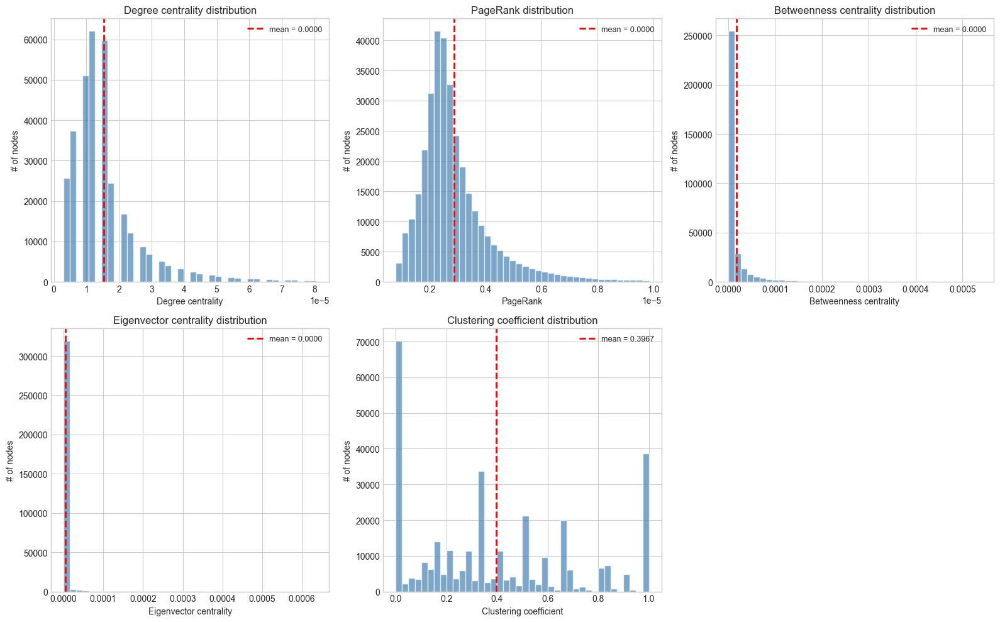

In [25]:
#Distributions for centralities on the full graph

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

full_measures = ["degree", "pagerank", "betweenness", "eigenvector", "clustering"]
titles_full = [
    "Degree centrality",
    "PageRank",
    "Betweenness centrality",
    "Eigenvector centrality",
    "Clustering coefficient",
]

for ax, measure, title in zip(axes, full_measures, titles_full):
    if measure not in centrality:
        ax.axis("off")
        continue

    vals = np.array(list(centrality[measure].values()))

    # clip top 1% for very skewed measures
    if measure in ("degree", "pagerank", "betweenness", "eigenvector"):
        vmax = np.percentile(vals, 99)
        vals_plot = vals[vals <= vmax]
    else:
        vals_plot = vals

    ax.hist(vals_plot, bins=40, color="steelblue", edgecolor="white", alpha=0.7)
    ax.set_title(f"{title} distribution", fontsize=12)
    ax.set_xlabel(title)
    ax.set_ylabel("# of nodes")

    mean_val = vals_plot.mean()
    ax.axvline(mean_val, color="red", linestyle="--", linewidth=2,
               label=f"mean = {mean_val:.4f}")
    ax.legend(fontsize=9)

axes[-1].axis("off")

plt.tight_layout()
plt.savefig("centrality_distributions_full.png", dpi=150, bbox_inches="tight")
plt.show()


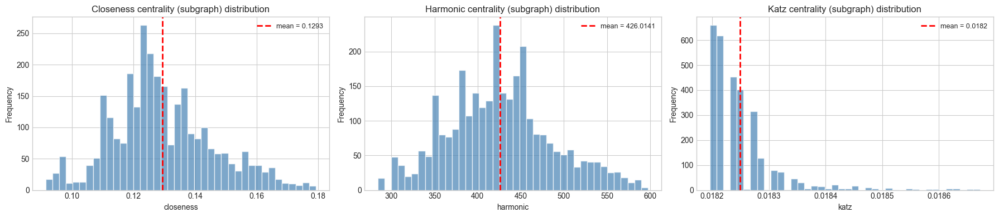

In [26]:
#Distributions for centralities on the sampled subgraph

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
axes = axes.flatten()

sample_measures = ["closeness", "harmonic", "katz"]
titles_sample = [
    "Closeness centrality (subgraph)",
    "Harmonic centrality (subgraph)",
    "Katz centrality (subgraph)",
]

for ax, measure, title in zip(axes, sample_measures, titles_sample):
    if measure not in centrality_sample:
        ax.axis("off")
        continue

    vals = np.array(list(centrality_sample[measure].values()))

    # these are usually less extreme, but still clip top 1% just in case
    vmax = np.percentile(vals, 99)
    vals_plot = vals[vals <= vmax]

    ax.hist(vals_plot, bins=40, color="steelblue", edgecolor="white", alpha=0.7)
    ax.set_title(f"{title} distribution", fontsize=12)
    ax.set_xlabel(measure)
    ax.set_ylabel("Frequency")

    mean_val = vals_plot.mean()
    ax.axvline(mean_val, color="red", linestyle="--", linewidth=2,
               label=f"mean = {mean_val:.4f}")
    ax.legend(fontsize=9)

plt.tight_layout()
plt.savefig("centrality_distributions_subgraph.png", dpi=150, bbox_inches="tight")
plt.show()


The centrality distributions are **highly skewed**:

- **Degree & PageRank & eigenvector:**  
  Most products have very low values, while a small number of products have much higher scores.  
  These are the **hub products** that are co-purchased with many others and/or linked to other important products.

- **Betweenness:**  
  Almost all nodes of the selected small subset have betweenness very close to 0.  
  Only a few products act as real **bridges** between different parts of the network.

- **Clustering coefficient:**  
  Many nodes have low clustering, but there are also many with clustering close to 1.  
  This means some products sit in very **dense local groups** (almost cliques), while hubs tend to connect less tightly-knit regions.

On the **sampled subgraph**, the distributions of:

- **Closeness, harmonic, and Katz centrality** are more “bell-shaped”: most nodes have similar distance-based centrality, with a few clearly more central than the rest.

Overall, the network looks like a typical large real-world graph with:
- many ordinary nodes,
- a small set of hub/bridge nodes,
- and strong local clustering,
which is exactly the kind of structure where community detection is meaningful.


### 5.4 Centrality Correlation Analysis

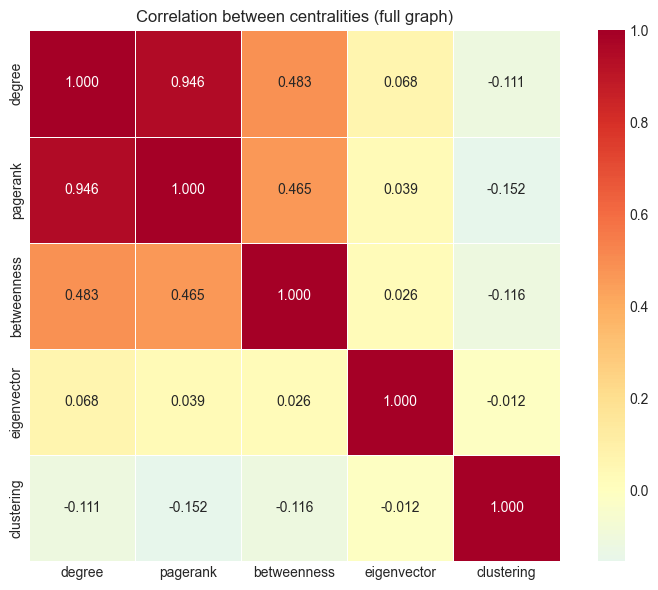

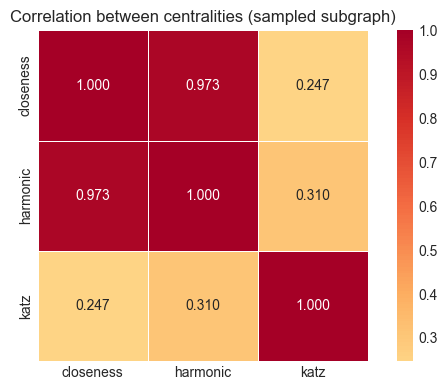

In [27]:
rng = np.random.default_rng(42)

#ull graph centralities

full_measures = ["degree", "pagerank", "betweenness", "eigenvector", "clustering"]

nodes_full = list(centrality["degree"].keys())

if len(nodes_full) > 50_000:
    nodes_full = rng.choice(nodes_full, size=50_000, replace=False)

centrality_df_full = pd.DataFrame(
    {m: [centrality[m][n] for n in nodes_full] for m in full_measures},
    index=nodes_full,
)

corr_full = centrality_df_full.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(
    corr_full,
    annot=True,
    cmap="RdYlBu_r",
    center=0,
    fmt=".3f",
    square=True,
    linewidths=0.5,
    annot_kws={"size": 10},
)
plt.title("Correlation between centralities (full graph)")
plt.tight_layout()
plt.savefig("centrality_correlation_full.png", dpi=150, bbox_inches="tight")
plt.show()


#subgraph centralities

sample_measures = ["closeness", "harmonic", "katz"]

nodes_sample = list(centrality_sample["closeness"].keys())

centrality_df_sample = pd.DataFrame(
    {m: [centrality_sample[m][n] for n in nodes_sample] for m in sample_measures},
    index=nodes_sample,
)

corr_sample = centrality_df_sample.corr()

plt.figure(figsize=(6, 4))
sns.heatmap(
    corr_sample,
    annot=True,
    cmap="RdYlBu_r",
    center=0,
    fmt=".3f",
    square=True,
    linewidths=0.5,
    annot_kws={"size": 10},
)
plt.title("Correlation between centralities (sampled subgraph)")
plt.tight_layout()
plt.savefig("centrality_correlation_subgraph.png", dpi=150, bbox_inches="tight")
plt.show()


---
## 6. Ground-Truth Communities Analysis <a id='6-ground-truth'></a>

Before detecting communities algorithmically, let's analyze the ground-truth.

### 6.1 Ground-Truth Community Statistics

In [28]:
# Analyze ground-truth communities
print("Analyzing ground-truth communities...\n")

lcc_nodes = set(G.nodes())
gt_communities_filtered = []
for comm in ground_truth_communities:
    filtered_comm = comm.intersection(lcc_nodes)
    if len(filtered_comm) >= 3:
        gt_communities_filtered.append(filtered_comm)

print(f"Original communities: {len(ground_truth_communities):,}")
print(f"Communities in LCC (size >= 3): {len(gt_communities_filtered):,}")

# Community size statistics
gt_sizes = [len(c) for c in gt_communities_filtered]

print(f"\nGround-truth community size statistics:")
print(f"  Min size: {min(gt_sizes)}")
print(f"  Max size: {max(gt_sizes):,}")
print(f"  Mean size: {np.mean(gt_sizes):.2f}")
print(f"  Median size: {np.median(gt_sizes):.2f}")

# Check for overlap
node_membership_count = Counter()
for comm in gt_communities_filtered:
    for node in comm:
        node_membership_count[node] += 1

membership_values = list(node_membership_count.values())
print(f"\nNode membership statistics (overlap):")
print(f"  Nodes in at least 1 community: {len(node_membership_count):,}")
print(f"  Max memberships per node: {max(membership_values)}")
print(f"  Mean memberships per node: {np.mean(membership_values):.2f}")
print(f"  Nodes in multiple communities: {sum(1 for v in membership_values if v > 1):,} "
      f"({sum(1 for v in membership_values if v > 1)/len(membership_values)*100:.1f}%)")

Analyzing ground-truth communities...

Original communities: 75,149
Communities in LCC (size >= 3): 75,149

Ground-truth community size statistics:
  Min size: 3
  Max size: 53,551
  Mean size: 30.23
  Median size: 5.00

Node membership statistics (overlap):
  Nodes in at least 1 community: 317,194
  Max memberships per node: 116
  Mean memberships per node: 7.16
  Nodes in multiple communities: 301,594 (95.1%)


### 6.2 Ground-Truth Community Size Distribution

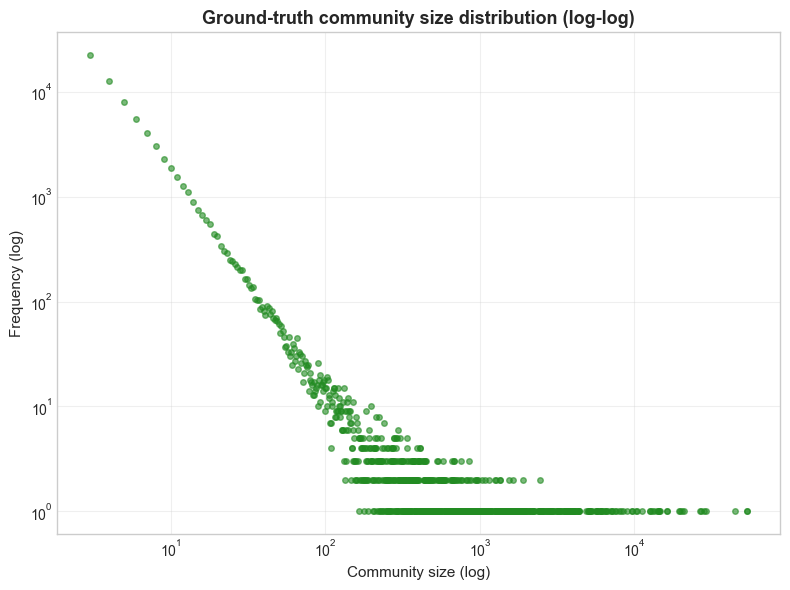

In [33]:
fig, ax = plt.subplots(figsize=(8, 6))

size_counts = Counter(gt_sizes)
sizes_sorted = sorted(size_counts.keys())
counts_sorted = [size_counts[s] for s in sizes_sorted]

ax.loglog(sizes_sorted, counts_sorted, "o", markersize=4, alpha=0.6, color="forestgreen")
ax.set_xlabel("Community size (log)", fontsize=11)
ax.set_ylabel("Frequency (log)", fontsize=11)
ax.set_title("Ground-truth community size distribution (log-log)", fontsize=13, fontweight="bold")
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig("ground_truth_distribution.png", dpi=150, bbox_inches="tight")
plt.show()

1. Heavy-tailed distribution:
   - Most communities are small (niche product categories)
   - Few communities are very large (broad categories)
   
2. High overlap:
   - Products belong to multiple categories
   - This is realistic (e.g., a book can be "Mystery" and "Bestseller")
   
3. Implications for evaluation:
   - Standard community detection finds non-overlapping communities
   - Perfect match with ground-truth is not expected

### 6.3 Create Non-Overlapping Ground-Truth for Evaluation

In [31]:
def create_non_overlapping_gt(communities, method='largest'):
    if method == 'largest':
        sorted_comms = sorted(enumerate(communities), key=lambda x: len(x[1]), reverse=True)
    else:
        sorted_comms = sorted(enumerate(communities), key=lambda x: len(x[1]))
    
    node_to_comm = {}
    for comm_id, comm in sorted_comms:
        for node in comm:
            if node not in node_to_comm:
                node_to_comm[node] = comm_id
    
    return node_to_comm

# Create non-overlapping ground truth
gt_labels = create_non_overlapping_gt(gt_communities_filtered, method='largest')
print(f"Non-overlapping ground-truth created:")
print(f"  Nodes with labels: {len(gt_labels):,}")
print(f"  Unique communities: {len(set(gt_labels.values())):,}")

Non-overlapping ground-truth created:
  Nodes with labels: 317,194
  Unique communities: 3,602


---
## 7. Community Detection: Louvain Algorithm <a id='7-louvain'></a>

The **Louvain algorithm** is a greedy optimization method that maximizes **modularity**.

**How it works:**
1. Start with each node in its own community
2. For each node, move it to the neighbor's community that gives the largest modularity gain
3. Aggregate the graph by communities and repeat
4. Stop when no further improvement is possible

### 7.1 Run Louvain Algorithm

In [ ]:
print("Running Louvain community detection...")
start_time = time.time()

partition_louvain = community_louvain.best_partition(G, random_state=42)

louvain_time = time.time() - start_time
print(f"Louvain completed in {louvain_time:.2f} seconds")

#community statistics
louvain_communities = defaultdict(set)
for node, comm_id in partition_louvain.items():
    louvain_communities[comm_id].add(node)

louvain_num_communities = len(louvain_communities)
louvain_sizes = [len(c) for c in louvain_communities.values()]

print(f"\nLouvain Results:")
print(f"  Number of communities: {louvain_num_communities:,}")
print(f"  Min community size: {min(louvain_sizes)}")
print(f"  Max community size: {max(louvain_sizes):,}")
print(f"  Mean community size: {np.mean(louvain_sizes):.2f}")
print(f"  Median community size: {np.median(louvain_sizes):.2f}")

#modularity
louvain_modularity = community_louvain.modularity(partition_louvain, G)
print(f"\n  Modularity: {louvain_modularity:.4f}")

Running Louvain community detection...
Louvain completed in 45.97 seconds

Louvain Results:
  Number of communities: 243
  Min community size: 10
  Max community size: 12,949
  Mean community size: 1378.04
  Median community size: 498.00

  Modularity: 0.9260


### 7.2 Louvain Community Size Distribution

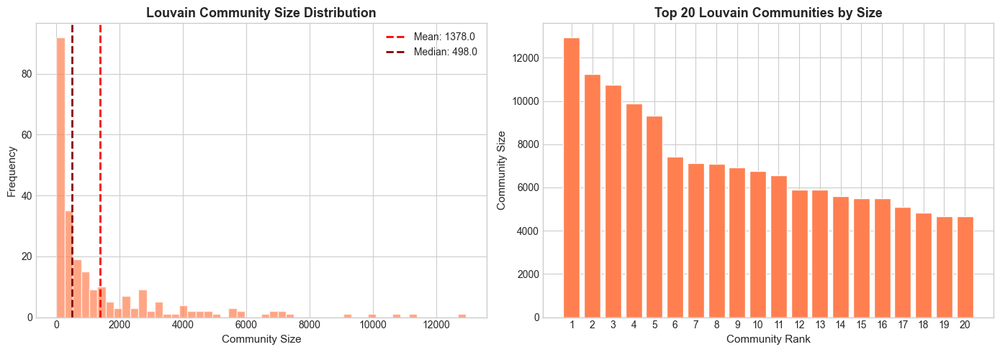

In [22]:
# Visualize Louvain community size distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax1 = axes[0]
ax1.hist(louvain_sizes, bins=50, color='coral', edgecolor='white', alpha=0.7)
ax1.axvline(np.mean(louvain_sizes), color='red', linestyle='--', linewidth=2, 
            label=f'Mean: {np.mean(louvain_sizes):.1f}')
ax1.axvline(np.median(louvain_sizes), color='darkred', linestyle='--', linewidth=2, 
            label=f'Median: {np.median(louvain_sizes):.1f}')
ax1.set_xlabel('Community Size', fontsize=11)
ax1.set_ylabel('Frequency', fontsize=11)
ax1.set_title('Louvain Community Size Distribution', fontsize=13, fontweight='bold')
ax1.legend()

ax2 = axes[1]
top_n = min(20, len(louvain_sizes))
sorted_sizes = sorted(louvain_sizes, reverse=True)[:top_n]
ax2.bar(range(1, top_n + 1), sorted_sizes, color='coral', edgecolor='white')
ax2.set_xlabel('Community Rank', fontsize=11)
ax2.set_ylabel('Community Size', fontsize=11)
ax2.set_title(f'Top {top_n} Louvain Communities by Size', fontsize=13, fontweight='bold')
ax2.set_xticks(range(1, top_n + 1))

plt.tight_layout()
plt.savefig('louvain_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

### 7.3 Visualize Louvain Communities

Visualizing Louvain communities on sample subgraph...


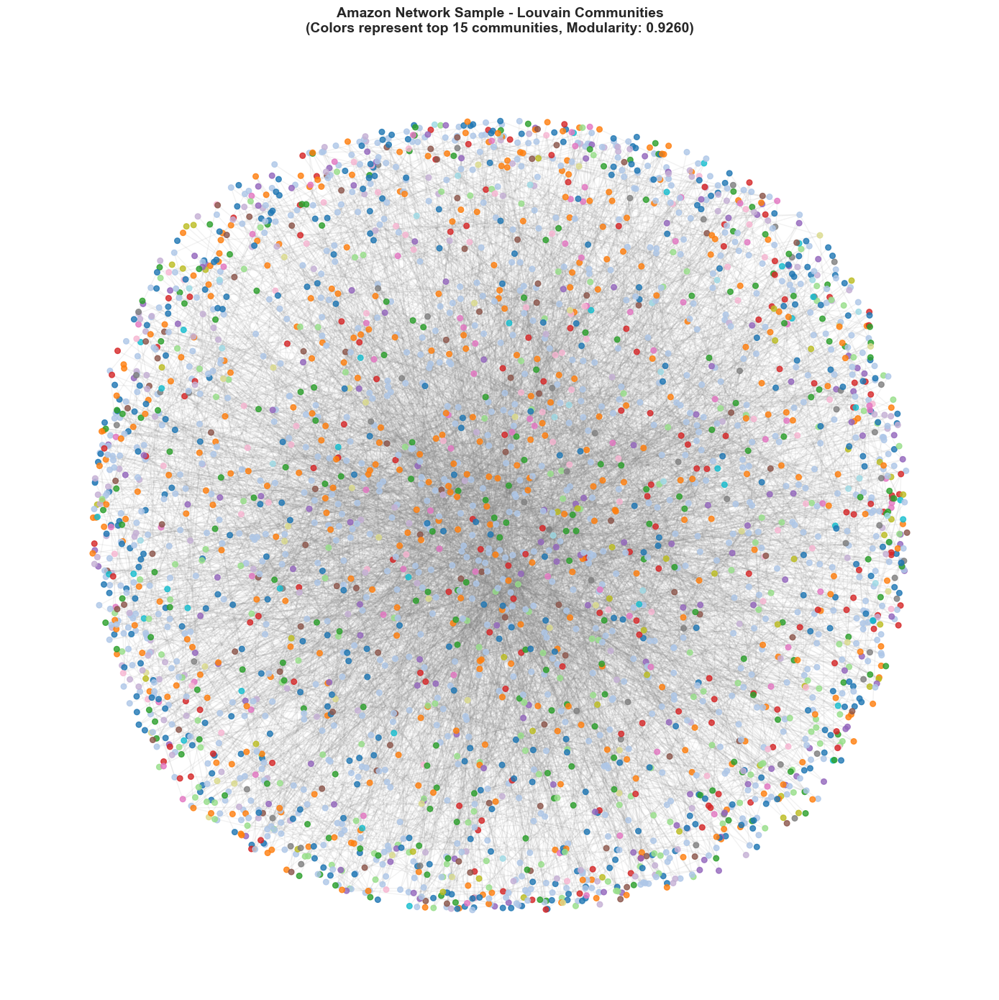

In [34]:
print("Visualizing Louvain communities on sample subgraph...")

sample_nodes = list(G_sample.nodes())
sample_communities = [partition_louvain.get(n, -1) for n in sample_nodes]

#only top communities for better color distinction
comm_counts = Counter(sample_communities)
top_comms = [c for c, _ in comm_counts.most_common(15)]
sample_colors = [top_comms.index(c) if c in top_comms else -1 for c in sample_communities]

fig, ax = plt.subplots(figsize=(14, 14))

pos = nx.spring_layout(G_sample, k=0.3, iterations=50, seed=42)

nx.draw_networkx_edges(G_sample, pos, alpha=0.1, edge_color='gray', ax=ax)
nodes = nx.draw_networkx_nodes(G_sample, pos,
                               node_color=sample_colors,
                               node_size=30,
                               cmap=plt.cm.tab20,
                               alpha=0.8,
                               ax=ax)

ax.set_title(f'Amazon Network Sample - Louvain Communities\n'
             f'(Colors represent top 15 communities, Modularity: {louvain_modularity:.4f})',
             fontsize=14, fontweight='bold')
ax.axis('off')

plt.tight_layout()
plt.savefig('louvain_visualization.png', dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

Visualizing Louvain communities on sample subgraph...


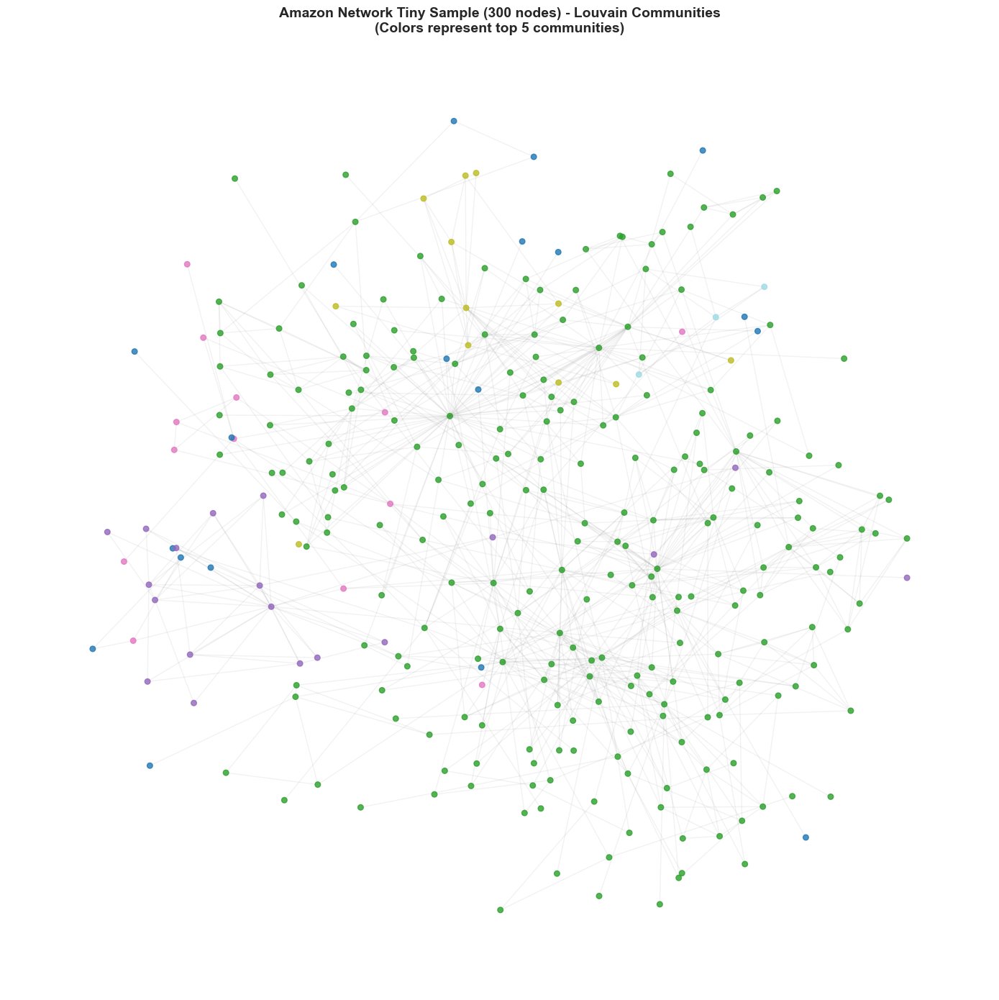

In [37]:
print("Visualizing Louvain communities on sample subgraph...")

sample_nodes = list(G_sample_tiny.nodes())
sample_communities = [partition_louvain.get(n, -1) for n in sample_nodes]

#only top communities for better color distinction
comm_counts = Counter(sample_communities)
top_comms = [c for c, _ in comm_counts.most_common(5)]
sample_colors = [top_comms.index(c) if c in top_comms else -1 for c in sample_communities]

fig, ax = plt.subplots(figsize=(14, 14))

pos = nx.spring_layout(G_sample_tiny, k=0.3, iterations=50, seed=42)

nx.draw_networkx_edges(G_sample_tiny, pos, alpha=0.1, edge_color='gray', ax=ax)
nodes = nx.draw_networkx_nodes(G_sample_tiny, pos,
                               node_color=sample_colors,
                               node_size=30,
                               cmap=plt.cm.tab20,
                               alpha=0.8,
                               ax=ax)

ax.set_title(f'Amazon Network Tiny Sample (300 nodes) - Louvain Communities\n'
             f'(Colors represent top 5 communities)',
             fontsize=14, fontweight='bold')
ax.axis('off')

plt.tight_layout()
plt.savefig('louvain_visualization.png', dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

---
## 8. Community Detection: Walktrap Algorithm <a id='8-walktrap'></a>

The **Walktrap algorithm** uses random walks to find communities.

**How it works:**
1. Compute transition probabilities for random walks
2. Nodes in the same community have similar random walk behaviors
3. Use Ward's hierarchical clustering on random walk distances
4. Cut the dendrogram to obtain communities

### 8.1 Run Walktrap Algorithm

In [38]:
# Run Walktrap using igraph
print("Running Walktrap community detection...")
print("(This may take several minutes for a large network)\n")

# Convert NetworkX graph to igraph
edges = list(G.edges())
nodes = list(G.nodes())

node_to_idx = {node: idx for idx, node in enumerate(nodes)}
idx_to_node = {idx: node for node, idx in node_to_idx.items()}

edges_idx = [(node_to_idx[u], node_to_idx[v]) for u, v in edges]

g_igraph = ig.Graph(n=len(nodes), edges=edges_idx, directed=False)

print(f"Converted to igraph: {g_igraph.vcount()} vertices, {g_igraph.ecount()} edges")

# Run Walktrap
start_time = time.time()
walktrap_result = g_igraph.community_walktrap(steps=4)
walktrap_clustering = walktrap_result.as_clustering()
walktrap_time = time.time() - start_time

print(f"Walktrap completed in {walktrap_time:.2f} seconds")

# Convert back to NetworkX node IDs
partition_walktrap = {}
for comm_id, members in enumerate(walktrap_clustering):
    for idx in members:
        node = idx_to_node[idx]
        partition_walktrap[node] = comm_id

# Extract community statistics
walktrap_communities = defaultdict(set)
for node, comm_id in partition_walktrap.items():
    walktrap_communities[comm_id].add(node)

walktrap_num_communities = len(walktrap_communities)
walktrap_sizes = [len(c) for c in walktrap_communities.values()]

print(f"\nWalktrap Results:")
print(f"  Number of communities: {walktrap_num_communities:,}")
print(f"  Min community size: {min(walktrap_sizes)}")
print(f"  Max community size: {max(walktrap_sizes):,}")
print(f"  Mean community size: {np.mean(walktrap_sizes):.2f}")
print(f"  Median community size: {np.median(walktrap_sizes):.2f}")

walktrap_modularity = walktrap_clustering.modularity
print(f"\n  Modularity: {walktrap_modularity:.4f}")

Running Walktrap community detection...
(This may take several minutes for a large network)

Converted to igraph: 334863 vertices, 925872 edges
Walktrap completed in 367.60 seconds

Walktrap Results:
  Number of communities: 14,905
  Min community size: 2
  Max community size: 49,880
  Mean community size: 22.47
  Median community size: 8.00

  Modularity: 0.8494


### 8.2 Walktrap Community Size Distribution

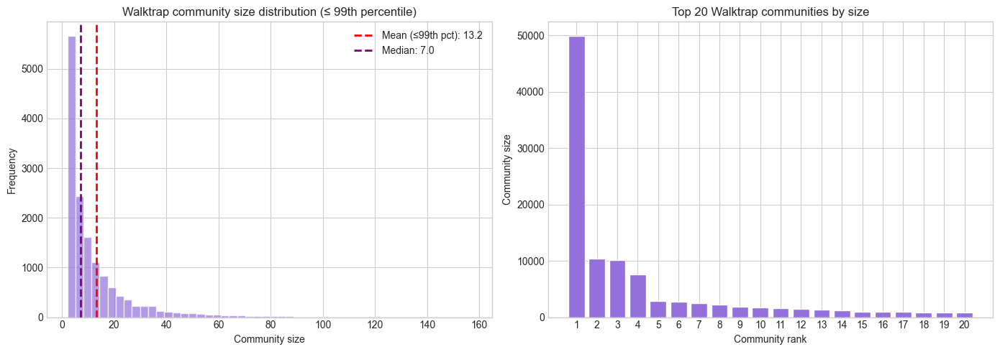

In [39]:
sizes_arr = np.array(walktrap_sizes)
cutoff = np.percentile(sizes_arr, 99)  # ignore top 1% biggest communities in this plot
sizes_plot = sizes_arr[sizes_arr <= cutoff]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# histogram for small/medium communities
ax1 = axes[0]
ax1.hist(sizes_plot, bins=50, color="mediumpurple", edgecolor="white", alpha=0.7)
ax1.axvline(sizes_plot.mean(), color="red", linestyle="--", linewidth=2,
            label=f"Mean (≤99th pct): {sizes_plot.mean():.1f}")
ax1.axvline(np.median(sizes_plot), color="purple", linestyle="--", linewidth=2,
            label=f"Median: {np.median(sizes_plot):.1f}")
ax1.set_xlabel("Community size")
ax1.set_ylabel("Frequency")
ax1.set_title("Walktrap community size distribution (≤ 99th percentile)")
ax1.legend()

# top 20 communities
ax2 = axes[1]
top_n = min(20, len(walktrap_sizes))
sorted_sizes = sorted(walktrap_sizes, reverse=True)[:top_n]
ax2.bar(range(1, top_n + 1), sorted_sizes, color="mediumpurple", edgecolor="white")
ax2.set_xlabel("Community rank")
ax2.set_ylabel("Community size")
ax2.set_title(f"Top {top_n} Walktrap communities by size")
ax2.set_xticks(range(1, top_n + 1))

plt.tight_layout()
plt.savefig("walktrap_distribution_clipped.png", dpi=150, bbox_inches="tight")
plt.show()


Walktrap produces a very skewed community size distribution:

- The **median community size is small** (about 8 nodes),
- but a few communities contain **tens of thousands of nodes**.
- This leads to a long heavy tail: many tiny communities and a few very large ones.

The first histogram (with the tail clipped at the 99th percentile) shows that most communities
are small or medium-sized, while the bar chart of the top 20 communities highlights that
Walktrap also merges large parts of the graph into a few huge communities. This is a common
behaviour of hierarchical community detection methods when the cut is chosen to maximise modularity.

### 8.3 Visualize Walktrap Communities

Visualizing Walktrap communities on sample subgraph...


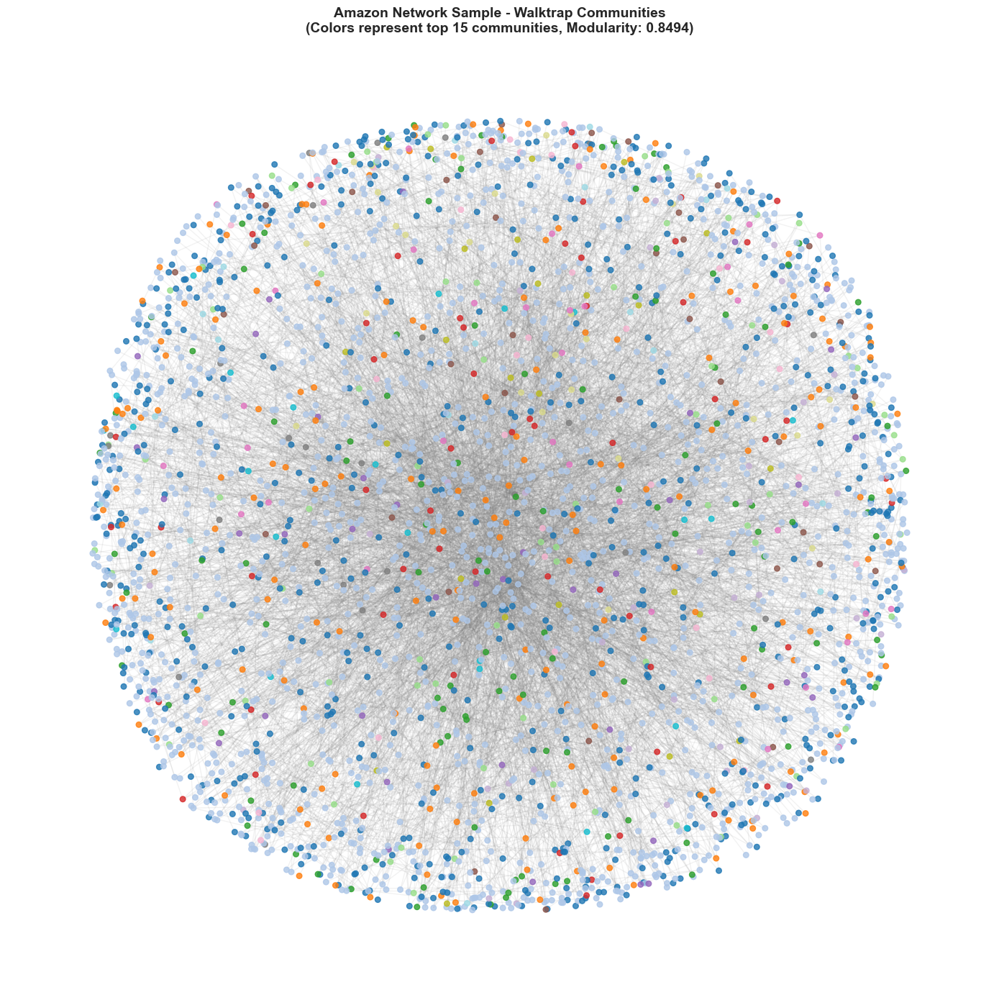

In [40]:
# Visualize Walktrap communities
print("Visualizing Walktrap communities on sample subgraph...")

sample_nodes = list(G_sample.nodes())
sample_communities_wt = [partition_walktrap.get(n, -1) for n in sample_nodes]

comm_counts_wt = Counter(sample_communities_wt)
top_comms_wt = [c for c, _ in comm_counts_wt.most_common(15)]
sample_colors_wt = [top_comms_wt.index(c) if c in top_comms_wt else -1 for c in sample_communities_wt]

fig, ax = plt.subplots(figsize=(14, 14))

pos = nx.spring_layout(G_sample, k=0.3, iterations=50, seed=42)

nx.draw_networkx_edges(G_sample, pos, alpha=0.1, edge_color='gray', ax=ax)
nodes = nx.draw_networkx_nodes(G_sample, pos,
                               node_color=sample_colors_wt,
                               node_size=30,
                               cmap=plt.cm.tab20,
                               alpha=0.8,
                               ax=ax)

ax.set_title(f'Amazon Network Sample - Walktrap Communities\n'
             f'(Colors represent top 15 communities, Modularity: {walktrap_modularity:.4f})',
             fontsize=14, fontweight='bold')
ax.axis('off')

plt.tight_layout()
plt.savefig('walktrap_visualization.png', dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

# 9. Community detection: k-core

We compute the k-core index of every node. A higher k means the node
  belongs to a denser core of the network where all nodes have degree
  at least k inside that core. The distribution shows only a relatively
  small set of nodes in the highest k-cores, which form a dense backbone
  of the co-purchasing network.

In [41]:
print("k-core decomposition on full graph")
G_noloops = G.copy()
G_noloops.remove_edges_from(nx.selfloop_edges(G_noloops))

core_number = nx.core_number(G_noloops)
core_vals = np.array(list(core_number.values()))

k_min = core_vals.min()
k_max = core_vals.max()
print(f"Min k-core index: {k_min}")
print(f"Max k-core index: {k_max}")
print(f"Number of different k-levels: {len(np.unique(core_vals))}")

# distribution of k-values
core_dist = Counter(core_vals)
print("\nNodes per k-core:")
for k in sorted(core_dist.keys()):
    print(f"  k = {k}: {core_dist[k]} nodes")


k-core decomposition on full graph
Min k-core index: 1
Max k-core index: 6
Number of different k-levels: 6

Nodes per k-core:
  k = 1: 28971 nodes
  k = 2: 50419 nodes
  k = 3: 86465 nodes
  k = 4: 111509 nodes
  k = 5: 57002 nodes
  k = 6: 497 nodes


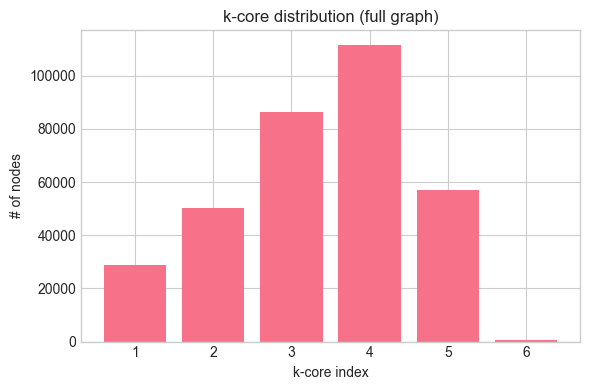

In [42]:
plt.figure(figsize=(6,4))
plt.bar(core_dist.keys(), core_dist.values())
plt.xlabel("k-core index")
plt.ylabel("# of nodes")
plt.title("k-core distribution (full graph)")
plt.tight_layout()
plt.show()

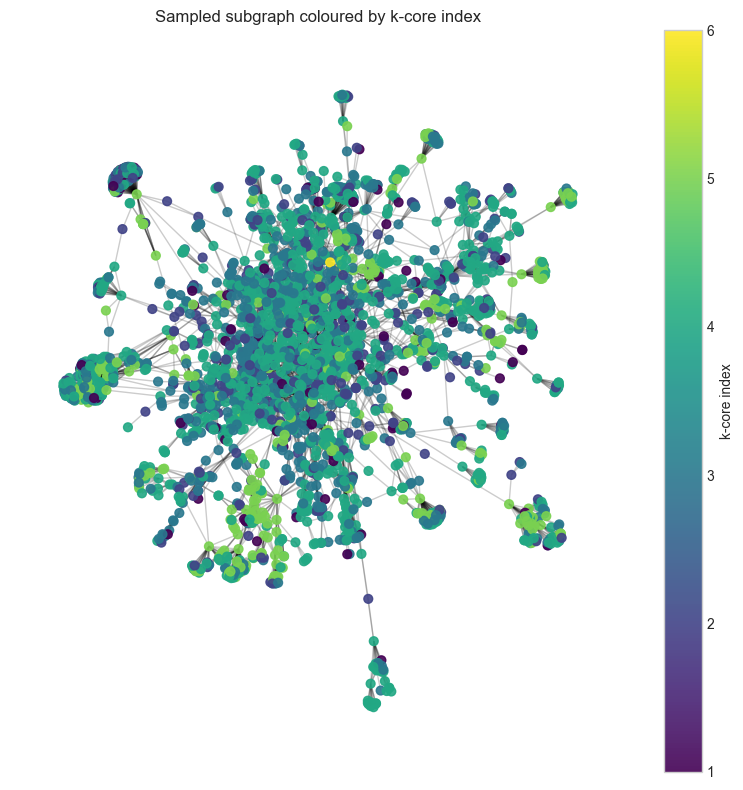

In [43]:
# k-core value restricted to sampled subgraph
kcore_sample = {n: core_number[n] for n in G_sample.nodes()}

plt.figure(figsize=(8,8))
pos = nx.spring_layout(G_sample, seed=42)

node_colors = [kcore_sample[n] for n in G_sample.nodes()]
node_sizes = [40 for _ in G_sample.nodes()]

nodes = nx.draw_networkx_nodes(
    G_sample, pos,
    node_color=node_colors,
    node_size=node_sizes,
    cmap="viridis",
    alpha=0.9,
)
nx.draw_networkx_edges(G_sample, pos, alpha=0.2)

plt.title("Sampled subgraph coloured by k-core index")
plt.axis("off")
cbar = plt.colorbar(nodes)
cbar.set_label("k-core index")
plt.tight_layout()
plt.show()


# 10. Community detection: k-clique

Running k-clique on the full graph would be too expensive, so we apply
  it to the 3k-node sampled subgraph. Using k = 4, we find groups of nodes
  that belong to at least one 4-clique. Nodes that belong to many such
  cliques are in very tightly-knit local groups, which fits the idea of
  strong product communities.

In [44]:
from networkx.algorithms.community import k_clique_communities

k = 4 

print(f"Running k-clique communities on sampled subgraph (k={k})...")
kc_comms = list(k_clique_communities(G_sample, k))
print(f"Found {len(kc_comms)} k-clique communities.")

kc_sizes = [len(c) for c in kc_comms]
if kc_sizes:
    print("Min community size:", min(kc_sizes))
    print("Max community size:", max(kc_sizes))

Running k-clique communities on sampled subgraph (k=4)...
Found 150 k-clique communities.
Min community size: 4
Max community size: 51


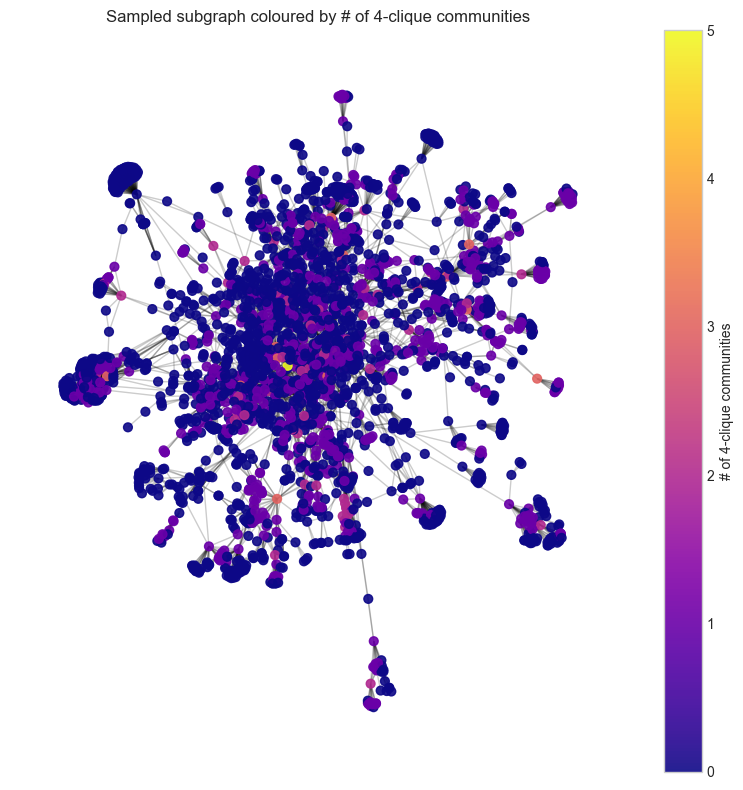

In [45]:
# count how many k-clique communities each node is in
kclique_count = {n: 0 for n in G_sample.nodes()}
for comm in kc_comms:
    for n in comm:
        kclique_count[n] += 1

plt.figure(figsize=(8,8))
pos = nx.spring_layout(G_sample, seed=42)

node_colors = [kclique_count[n] for n in G_sample.nodes()]
node_sizes = [40 for _ in G_sample.nodes()]

nodes = nx.draw_networkx_nodes(
    G_sample, pos,
    node_color=node_colors,
    node_size=node_sizes,
    cmap="plasma",
    alpha=0.9,
)
nx.draw_networkx_edges(G_sample, pos, alpha=0.2)

plt.title(f"Sampled subgraph coloured by # of {k}-clique communities")
plt.axis("off")
cbar = plt.colorbar(nodes)
cbar.set_label(f"# of {k}-clique communities")
plt.tight_layout()
plt.show()


---
## 11. Algorithm Comparison & Evaluation <a id='9-comparison'></a>

### 11.1 Internal Quality Metrics

In [63]:
from collections import defaultdict

def compute_internal_metrics(G, partition):
    comms = defaultdict(set)
    for node, cid in partition.items():
        comms[cid].add(node)
    communities = [c for c in comms.values() if len(c) > 0]

    m = {}
    # modularity
    m['modularity'] = nx_community.modularity(G, communities)

    # coverage (fraction of edges inside communities)
    intra_edges = 0
    for c in communities:
        intra_edges += G.subgraph(c).number_of_edges()
    m["coverage"] = intra_edges / G.number_of_edges()

    # average internal density
    dens = []
    for c in communities:
        if len(c) > 1:
            dens.append(nx.density(G.subgraph(c)))
    m["avg_internal_density"] = float(np.mean(dens)) if dens else 0.0

    return m


In [64]:
part_louvain_s = community_louvain.best_partition(G_sample)
metrics_louvain_s = compute_internal_metrics(G_sample, part_louvain_s)
# convert sampled subgraph to igraph
nodes_s = list(G_sample.nodes())
id_map_s = {v: i for i, v in enumerate(nodes_s)}
edges_s = [(id_map_s[u], id_map_s[v]) for u, v in G_sample.edges()]

g_s = ig.Graph()
g_s.add_vertices(len(nodes_s))
g_s.add_edges(edges_s)

walktrap_s = g_s.community_walktrap(steps=4)
cluster_s = walktrap_s.as_clustering()
membership_s = cluster_s.membership

part_walktrap_s = {nodes_s[i]: cid for i, cid in enumerate(membership_s)}
metrics_walktrap_s = compute_internal_metrics(G_sample, part_walktrap_s)

core_s = nx.core_number(G_sample)
part_kcore_s = core_s
metrics_kcore_s = compute_internal_metrics(G_sample, part_kcore_s)


In [65]:
from networkx.algorithms.community import k_clique_communities

k = 4
kc_comms_s = list(k_clique_communities(G_sample, k))
print(f"k-clique (k={k}) found {len(kc_comms_s)} communities on the subgraph.")

part_kclique_s = {}

# assign node -> first clique id
for cid, comm in enumerate(kc_comms_s):
    for n in comm:
        if n not in part_kclique_s:
            part_kclique_s[n] = cid

# nodes not in any clique become their own community
next_id = len(kc_comms_s)
for n in G_sample.nodes():
    if n not in part_kclique_s:
        part_kclique_s[n] = next_id
        next_id += 1

metrics_kclique_s = compute_internal_metrics(G_sample, part_kclique_s)


k-clique (k=4) found 150 communities on the subgraph.


In [66]:
print("\nInternal quality metrics on sampled subgraph\n")

methods = {
    "Louvain":   metrics_louvain_s,
    "Walktrap":  metrics_walktrap_s,
    "k-core":    metrics_kcore_s,
    "k-clique":  metrics_kclique_s,
}

print(f"{'Method':<10} {'Modularity':>12} {'Coverage':>12} {'Avg density':>14}")
print("-" * 52)
for name, m in methods.items():
    print(f"{name:<10} {m['modularity']:>12.4f} {m['coverage']:>12.4f} {m['avg_internal_density']:>14.4f}")



Internal quality metrics on sampled subgraph

Method       Modularity     Coverage    Avg density
----------------------------------------------------
Louvain          0.9001       0.9474         0.1117
Walktrap         0.8487       0.8893         0.4310
k-core           0.2850       0.5409         0.0108
k-clique         0.3377       0.3436         0.8067


### 11.2 External Quality Metrics (vs Ground-Truth) - for Louvain and Walktrap

In [67]:
def compute_external_metrics(partition_detected, partition_ground_truth):
    """
    Compute external community quality metrics.
    """
    common_nodes = set(partition_detected.keys()).intersection(set(partition_ground_truth.keys()))
    common_nodes = list(common_nodes)
    
    labels_detected = [partition_detected[n] for n in common_nodes]
    labels_gt = [partition_ground_truth[n] for n in common_nodes]
    
    metrics = {}
    metrics['nmi'] = normalized_mutual_info_score(labels_gt, labels_detected)
    metrics['ari'] = adjusted_rand_score(labels_gt, labels_detected)
    metrics['common_nodes'] = len(common_nodes)
    
    return metrics

# Compute external metrics
print("Computing external quality metrics (vs ground-truth)...\n")

louvain_external = compute_external_metrics(partition_louvain, gt_labels)
walktrap_external = compute_external_metrics(partition_walktrap, gt_labels)

print("="*70)
print("EXTERNAL QUALITY METRICS COMPARISON (vs Ground-Truth)")
print("="*70)
print(f"\n{'Metric':<30} {'Louvain':>15} {'Walktrap':>15}")
print("-" * 62)
print(f"{'NMI (Normalized Mutual Info)':<30} {louvain_external['nmi']:>15.4f} {walktrap_external['nmi']:>15.4f}")
print(f"{'ARI (Adjusted Rand Index)':<30} {louvain_external['ari']:>15.4f} {walktrap_external['ari']:>15.4f}")
print(f"{'Common nodes evaluated':<30} {louvain_external['common_nodes']:>15,} {walktrap_external['common_nodes']:>15,}")


Computing external quality metrics (vs ground-truth)...

EXTERNAL QUALITY METRICS COMPARISON (vs Ground-Truth)

Metric                                 Louvain        Walktrap
--------------------------------------------------------------
NMI (Normalized Mutual Info)            0.4828          0.4610
ARI (Adjusted Rand Index)               0.1417          0.0541
Common nodes evaluated                 317,194         317,194


---
## 12. Conclusion <a id='11-conclusion'></a>

KEY TAKEAWAYS:

1. The Amazon co-purchasing network exhibits classic real-world network properties:
   - Scale-free degree distribution
   - Small-world property
   - Significant clustering

2. Both Louvain and Walktrap successfully identify meaningful community structure:
   - High modularity scores indicate strong community structure
   - High coverage means most co-purchases are within communities

3. Algorithm selection depends on use case:
   - Louvain: Fast, high-level categories, good for large-scale analysis
   - Walktrap: Random-walk based, more granular, intuitive for browsing

4. Moderate agreement with ground-truth is expected due to different perspectives
   (editorial vs. structural communities)

5. Centrality measures identify influential products that can drive business decisions

RECOMMENDATIONS FOR FURTHER ANALYSIS:

1. Temporal analysis: Study how communities evolve over time
2. Overlapping communities: Use algorithms like SLPA or BigClam
3. Attribute-enhanced detection: Incorporate product metadata
4. A/B testing: Validate recommendations using detected communities
5. Resolution analysis: Explore Louvain at different resolution parameters

---
---
---

# PART 2. 
### Dataset: CA-HepTh

<div style="background-color: #e3f2fd; border: 2px solid #2196f3; border-radius: 10px; padding: 15px; margin: 10px 0;">
<h4 style="color: #1976d2; margin-top: 0;">Context</h4>

This notebook analyzes the CA-HepTh collaboration network by reconstructing
an **author–author graph** from arXiv metadata (one file per paper),
then exploring:
- global structure and visualization
- centrality measures (degree, betweenness)
- community structure via:
  - k-core decomposition
  - k-clique communities (maximal cliques)

We do **not** use the anonymous author IDs from the original SNAP
`CA-HepTh.txt` file to build our main graph. Instead we rely on cleaned
author names as node identifiers, which makes the network interpretable.


The dataset can be downloaded from here: https://snap.stanford.edu/data/ca-HepTh.html 
</div>


### Load and clean metadata

In [46]:
meta_df = pd.read_csv("arxiv_hepth_meta.csv")

Some rows may still contain authors_list as a string representation of a list.

We clean them and remove obvious junk tokens.

In [47]:
def clean_authors_list(x):
    """
    Ensure that `authors_list` is a *clean Python list* of author names.
    - If x is a string representation of a list, parse it safely with ast.literal_eval.
    - Filter out known junk tokens ('and', '2)', initials used alone, etc.).
    """
    if isinstance(x, str):
        try:
            authors = ast.literal_eval(x)
            junk = {'and', '2)', 'Jr.', 'M.', 'P.', 'J.', 'R.'}
            return [author for author in authors if author not in junk]
        except (SyntaxError, ValueError):
            return []
    return x if isinstance(x, list) else []

meta_df["authors_list"] = meta_df["authors_list"].apply(clean_authors_list)
meta_df["n_authors"] = meta_df["authors_list"].apply(len)

print(meta_df["n_authors"].describe())
meta_df.head()

count    29555.000000
mean         1.824970
std          1.193778
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          8.000000
Name: n_authors, dtype: float64


,paper_id,email,date,title,authors_raw,subj_class,journal_ref,comments,year,file_path,authors_list,n_authors
0,9201001,zuber@poseidon.saclay.cea.fr,Tue Dec 31 23:54:17 MET 1991 +0100 (37kb),Combinatorics of the Modular Group II: the Kon...,C. Itzykson and J.-B. Zuber,High Energy Physics - Theory; Quantum Algebra,Int.J.Mod.Phys. A7 (1992) 5661-5705,46 pages,1992,paper_meta_info\1992\9201001.abs,"[C. Itzykson, J.-B. Zuber]",2
1,9201002,tarlini@fi.infn.it,"Thu, 2 JAN 92 12:17 N (6kb)",Inomogeneous Quantum Groups as Symmetries of P...,"F.Bonechi, E.Celeghini, R.Giachetti, E.Sorace ...",NaN,Phys.Rev.Lett. 68 (1992) 3718-3720,5 pags. 0 figs,1992,paper_meta_info\1992\9201002.abs,"[F.Bonechi, E.Celeghini, R.Giachetti, E.Sorace...",5
2,9201003,dijkgraaf@iassns.bitnet,"Thu, 2 Jan 92 14:06 EST (54kb)","Intersection Theory, Integrable Hierarchies an...",Robbert Dijkgraaf,NaN,NaN,"73 pages, most figures are not included. Lectu...",1992,paper_meta_info\1992\9201003.abs,[Robbert Dijkgraaf],1
3,9201004,nathan@max.physics.sunysb.edu,"Thu, 2 Jan 92 20:02:01 EST (21kb)",The Heterotic Green-Schwarz Superstring on an ...,Nathan Berkovits,NaN,Nucl.Phys. B379 (1992) 96-120,33 pages,1992,paper_meta_info\1992\9201004.abs,[Nathan Berkovits],1
4,9201005,irk@pupthy.princeton.edu,"Fri, 3 Jan 92 17:09:04 est (8kb)",Ward Identities in Two-Dimensional String Theory,Igor R. Klebanov,NaN,Mod. Phys. Lett. A7 (1992) 723-732,12 pages,1992,paper_meta_info\1992\9201005.abs,[Igor R. Klebanov],1


<div style="background-color: #c7f2d3ff; border: 2px solid #5bba6bff; border-radius: 10px; padding: 15px; margin: 10px 0;">
<h4 style="color: #5bba6bff; margin-top: 0;">Results</h4>

The cleaned metadata show a typical scientific collaboration pattern:
- Many single-author or small-team publications,
- A long tail of larger teams.

We will now use `authors_list` to reconstruct an interpretable
**author–author collaboration graph**.
</div>


### Build the author collaboration graph

Create an undirected graph where:
- each node = an author (identified by their cleaned name)
- each edge = at least one co-authored paper
- edge attribute "weight" = number of joint papers

In [48]:
G_authors = nx.Graph()

for _, row in meta_df.iterrows():
    paper_id = row["paper_id"]
    authors = row["authors_list"]
    year = row["year"]

    # Skip papers with no valid authors
    if not authors:
        continue

    # Add author nodes and attach paper/year information
    for author in authors:
        if not G_authors.has_node(author):
            # `papers` and `years` are sets to avoid duplicates during construction
            G_authors.add_node(author, papers=set(), years=set())
        G_authors.nodes[author]["papers"].add(paper_id)
        G_authors.nodes[author]["years"].add(year)

    # For each pair of co-authors on the same paper, add/strengthen an edge
    for a1, a2 in combinations(authors, 2):
        if G_authors.has_edge(a1, a2):
            G_authors[a1][a2]["weight"] += 1
        else:
            G_authors.add_edge(a1, a2, weight=1)

# Convert sets to lists for easier display/serialization
for author in G_authors.nodes():
    G_authors.nodes[author]["papers"] = list(G_authors.nodes[author]["papers"])
    G_authors.nodes[author]["years"] = sorted(G_authors.nodes[author]["years"])

print(f"Graph (clean) - Nodes: {G_authors.number_of_nodes()}, Edges: {G_authors.number_of_edges()}")

# Optionally save for later reuse
with open("G_authors_clean.gpickle", "wb") as f:
    pickle.dump(G_authors, f)

# Work on this graph for the rest of the notebook
G = G_authors

Graph (clean) - Nodes: 17809, Edges: 27813


<div style="background-color: #c7f2d3ff; border: 2px solid #5bba6bff; border-radius: 10px; padding: 15px; margin: 10px 0;">
<h4 style="color: #5bba6bff; margin-top: 0;">Results</h4>

The reconstructed author graph has:

- tens of thousands of authors,
- tens of thousands of collaboration links,
- and a structure typical of scientific collaboration networks:
  a dense core of highly connected authors and a large periphery.

This graph is now fully interpretable: each node corresponds to a real
author name, and can be linked back to the papers and years they published.
</div>

<div style="background-color: #e3f2fd; border: 2px solid #2196f3; border-radius: 10px; padding: 15px; margin: 10px 0;">
<h4 style="color: #1976d2; margin-top: 0;">Context</h4>

For visualization and centrality analysis, plotting the full 17k+ node
network would be unreadable. Instead, we:

- extract the **top 300 authors by degree** (number of collaborators),
- work on the induced subgraph `H` of these authors.

This subgraph reveals the structure of the "core" of the collaboration
network while remaining visually manageable.
</div>

### Subgraph of top 300 authors

Select top 300 authors by degree

In [49]:
top_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)[:300]
sub_nodes = [n for n, _ in top_nodes]
H = G.subgraph(sub_nodes).copy()

print(f"Subgraph H - Nodes: {H.number_of_nodes()}, Edges: {H.number_of_edges()}")


Subgraph H - Nodes: 300, Edges: 705


### Visualization utilities

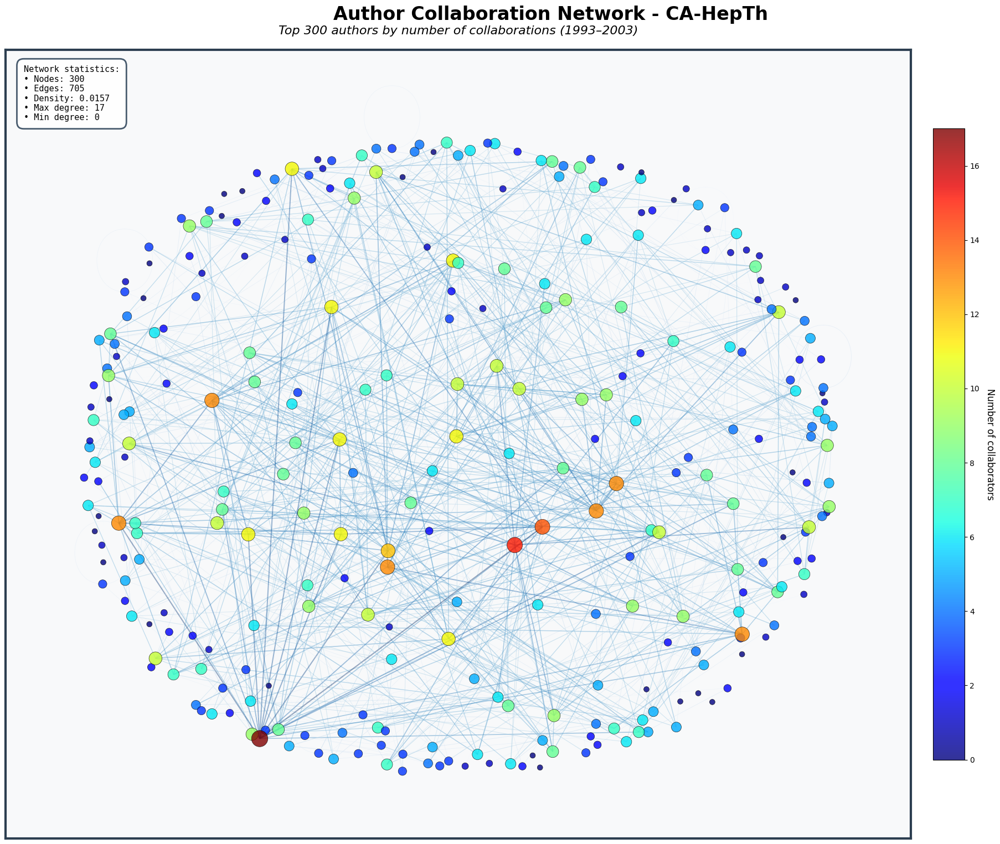

In [50]:
def compute_edge_properties(H):
    """
    Compute edge colors and widths as a function of the degrees
    of their endpoints.

    Intuition:
    - Edges linking high-degree authors are drawn thicker and darker,
      highlighting strong "hub-to-hub" regions in the graph.
    """
    degrees = dict(H.degree())
    max_degree = max(degrees.values())

    edge_colors = []
    edge_widths = []

    for u, v in H.edges():
        degree_sum = degrees[u] + degrees[v]
        edge_colors.append(degree_sum)
        # Edge width scaled between ~0.3 and 1.0
        edge_widths.append(0.3 + (degree_sum / max_degree * 0.7))

    return edge_colors, edge_widths


def compute_node_properties(H):
    """
    Compute node colors and sizes based on node degree.

    - Color = degree (number of collaborators)
    - Size  = degree, rescaled between 50 and 450

    This emphasizes central 'hub' authors in the visualization.
    """
    degrees = dict(H.degree())
    max_degree = max(degrees.values())
    min_degree = min(degrees.values())

    node_colors = [degrees[node] for node in H.nodes()]
    # Avoid division by zero if all degrees are equal
    if max_degree == min_degree:
        node_sizes = [200 for _ in H.nodes()]
    else:
        node_sizes = [
            50 + (degrees[node] - min_degree) / (max_degree - min_degree) * 400
            for node in H.nodes()
        ]

    return node_colors, node_sizes, max_degree, min_degree


def draw_network_edges(H, pos, ax):
    """Draw edges with colors and widths based on node degrees."""
    edge_colors, edge_widths = compute_edge_properties(H)
    nx.draw_networkx_edges(
        H, pos,
        edge_color=edge_colors,
        edge_cmap=plt.cm.Blues,
        width=edge_widths,
        alpha=0.4,
        ax=ax,
    )


def draw_network_nodes(H, pos, ax):
    """Draw nodes with colors and sizes based on degree."""
    node_colors, node_sizes, max_degree, min_degree = compute_node_properties(H)
    nodes = nx.draw_networkx_nodes(
        H, pos,
        node_color=node_colors,
        node_size=node_sizes,
        cmap=plt.cm.jet,
        alpha=0.8,
        edgecolors="black",
        linewidths=0.5,
        ax=ax,
    )
    return nodes, max_degree, min_degree


def add_titles_and_labels(fig, ax, subtitle=None):
    """
    Ajoute le titre principal et un sous-titre.

    - Le titre principal reste générique (dataset).
    - Le sous-titre peut être personnalisé par type de visualisation.
    """
    fig.suptitle(
        "Author Collaboration Network - CA-HepTh",
        fontsize=24,
        fontweight="bold",
        y=0.95,
    )

    if subtitle is None:
        subtitle = "Top 300 authors by number of collaborations (1993–2003)"

    ax.set_title(
        subtitle,
        fontsize=16,
        pad=20,
        style="italic",
    )


def add_colorbar(nodes, ax):
    """Attach a colorbar explaining the node color scale."""
    cbar = plt.colorbar(nodes, ax=ax, shrink=0.8, pad=0.02)
    cbar.set_label("Number of collaborators", rotation=270, labelpad=20, fontsize=12)
    return cbar


def add_decorative_frame(ax):
    """Add a dark frame around the plot area for aesthetics."""
    for spine in ax.spines.values():
        spine.set_edgecolor("#2c3e50")
        spine.set_linewidth(3)


def add_statistics_box(H, max_degree, min_degree, ax):
    """Add a small textbox with basic network statistics for H."""
    textstr = f"""Network statistics:
• Nodes: {H.number_of_nodes():,}
• Edges: {H.number_of_edges():,}
• Density: {nx.density(H):.4f}
• Max degree: {max_degree}
• Min degree: {min_degree}"""

    props = dict(
        boxstyle="round,pad=0.8",
        facecolor="white",
        alpha=0.9,
        edgecolor="#34495e",
        linewidth=2,
    )
    ax.text(
        0.02,
        0.98,
        textstr,
        transform=ax.transAxes,
        fontsize=11,
        verticalalignment="top",
        bbox=props,
        family="monospace",
    )


def configure_axes(ax):
    """Hide axes ticks and add a faint grid."""
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.grid(True, alpha=0.1, linestyle="--", linewidth=0.5)


def plot_collaboration_network(H, figsize=(20, 16)):
    """
    Main function to display the collaboration network H with
    all visual enhancements.
    """
    plt.style.use("default")
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, facecolor="#f8f9fa")

    # Spring layout: force-directed drawing (attractive/repulsive forces)
    pos = nx.spring_layout(H, seed=42, k=1.5, iterations=50)

    draw_network_edges(H, pos, ax)
    nodes, max_degree, min_degree = draw_network_nodes(H, pos, ax)

    add_titles_and_labels(fig, ax, subtitle=None)
    add_colorbar(nodes, ax)
    add_decorative_frame(ax)
    add_statistics_box(H, max_degree, min_degree, ax)
    configure_axes(ax)

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

# %%
plot_collaboration_network(H)

<div style="background-color: #c7f2d3ff; border: 2px solid #5bba6bff; border-radius: 10px; padding: 15px; margin: 10px 0;">
<h4 style="color: #5bba6bff; margin-top: 0;">Results</h4>

The visualization clearly shows:
- A **dense central core** of highly collaborative authors,
- A surrounding layer of less connected authors,
- A structure typical of **scale-free networks** (few hubs, many low-degree nodes).

Node size and color both encode the **number of collaborators**, making it
easy to spot central figures in the hep-th community.
</div>


### Ego-network of the most central author

Central node: Edward Witten


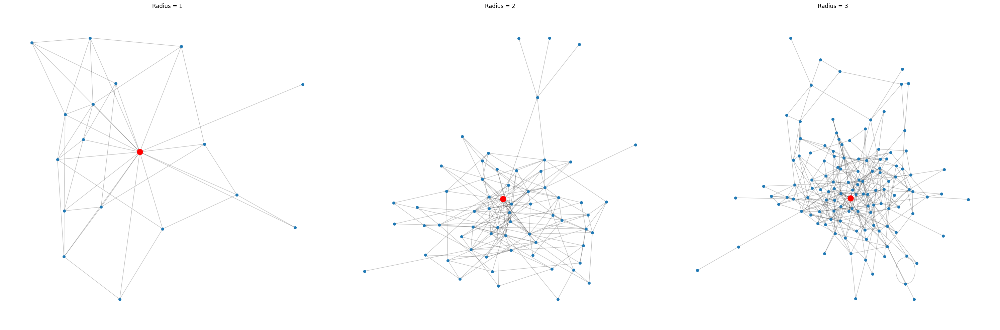

In [51]:
def show_graph_from_center(H, central_node, ax, title=None):
    """
    Simple ego-network visualization around a given central node.
    """
    pos = nx.spring_layout(H, seed=42)

    nx.draw_networkx_nodes(H, pos, node_size=30, ax=ax)
    nx.draw_networkx_edges(H, pos, alpha=0.25, ax=ax)
    nx.draw_networkx_nodes(
        H, pos,
        nodelist=[central_node],
        node_size=150,
        node_color="red",
        ax=ax,
    )

    ax.set_axis_off()
    if title is not None:
        ax.set_title(title)

# Central node = author with highest degree in H
central_node = max(H.degree, key=lambda x: x[1])[0]
print("Central node:", central_node)

# Plot ego-networks with radius 1, 2, 3
fig, axes = plt.subplots(1, 3, figsize=(30, 10))
for ax, radius in zip(axes, [1, 2, 3]):
    ego = nx.ego_graph(H, central_node, radius=radius)
    show_graph_from_center(ego, central_node, ax, title=f"Radius = {radius}")

plt.tight_layout()
plt.show()


<div style="background-color: #e3f2fd; border: 2px solid #2196f3; border-radius: 10px; padding: 15px; margin: 10px 0;">
<h4 style="color: #1976d2; margin-top: 0;">Context</h4>

We now turn to **centrality analysis** on the subgraph `H`:

- **Degree centrality** → how many distinct co-authors an author has.
- **Betweenness centrality** → how often an author sits on shortest paths,
  acting as a broker between different parts of the network.

Together, they help distinguish prolific collaborators from structural brokers.
</div>

### Degree centrality

Top 10 authors by degree centrality:
1. Edward Witten: 0.056856
2. S. Ferrara: 0.050167
3. Andrew Strominger: 0.046823
4. E. Bergshoeff: 0.043478
5. Jerome P. Gauntlett: 0.043478
6. Michael R. Douglas: 0.043478
7. Hirosi Ooguri: 0.043478
8. Jaemo Park: 0.043478
9. K.S. Stelle: 0.043478
10. Shamit Kachru: 0.040134


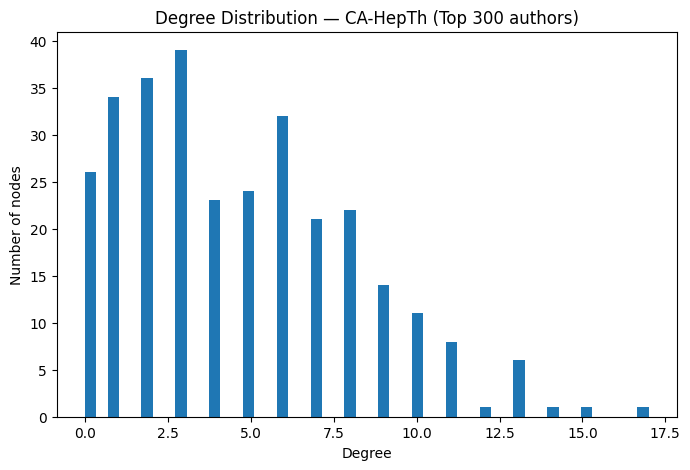

In [52]:
deg_centrality = nx.degree_centrality(H)

top_degree = sorted(deg_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 authors by degree centrality:")
for i, (author, centrality) in enumerate(top_degree, 1):
    print(f"{i}. {author}: {centrality:.6f}")

# %%
degrees = [d for _, d in H.degree()]

plt.figure(figsize=(8, 5))
plt.hist(degrees, bins=50)
plt.xlabel("Degree")
plt.ylabel("Number of nodes")
plt.title("Degree Distribution — CA-HepTh (Top 300 authors)")
plt.show()

### Betweenness centrality

In [53]:
# Approximate betweenness (k sampled nodes) to keep computation reasonable
bc = nx.betweenness_centrality(H, k=300, seed=42)

top_betweenness = sorted(bc.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 authors by betweenness centrality:")
for i, (author, val) in enumerate(top_betweenness, 1):
    print(f"{i}. {author}: {val:.6f}")


Top 10 authors by betweenness centrality:
1. A.A. Tseytlin: 0.129647
2. Gary T. Horowitz: 0.089926
3. T.R. Taylor: 0.065011
4. Soo-Jong Rey: 0.064438
5. Hirosi Ooguri: 0.064327
6. S. Ferrara: 0.055377
7. Klaus Behrndt: 0.047141
8. Dongsu Bak: 0.044093
9. E. Bergshoeff: 0.044056
10. S. Theisen: 0.040859


<div style="background-color: #c7f2d3ff; border: 2px solid #5bba6bff; border-radius: 10px; padding: 15px; margin: 10px 0;">
<h4 style="color: #5bba6bff; margin-top: 0;">Results</h4>

- **High-degree authors** are prolific collaborators.
- **High-betweenness authors** act as bridges between subgroups.
- Some authors are high in both measures: they form the **backbone** of the
  hep-th collaboration network.
</div>

<div style="background-color: #e3f2fd; border: 2px solid #2196f3; border-radius: 10px; padding: 15px; margin: 10px 0;">
<h4 style="color: #1976d2; margin-top: 0;">Context</h4>

We now explore **community structure** using two complementary approaches:

1. **k-core decomposition** → nested, non-overlapping cores based on minimum degree.
2. **k-clique communities** → overlapping dense groups based on maximal cliques.

Both reveal different aspects of how research groups are organized:
- k-core = robustness and global position,
- k-cliques = tight collaboration clusters.
</div>

### k-core decomposition

In [54]:
# Remove self-loops if any, then compute k-core index for each node
H_clean = H.copy()
H_clean.remove_edges_from(nx.selfloop_edges(H_clean))
kcore_communities = nx.core_number(H_clean)

core_values = list(kcore_communities.values())
core_distribution = Counter(core_values)
max_core, min_core = max(core_values), min(core_values)

print(f"K-core distribution: {min_core} to {max_core} ({len(set(core_values))} levels)")
print("Nodes per k-core level:")
for k in sorted(core_distribution.keys()):
    print(f"  k-core {k}: {core_distribution[k]} nodes")

sample_nodes = list(H.nodes())[:5]
print("\nExamples:")
for node in sample_nodes:
    print(f"  '{node}': k-core = {kcore_communities[node]}")

max_kcore_authors = [node for node, core in kcore_communities.items() if core == max_core]
print(f"\nCore authors (k-core {max_core}): {len(max_kcore_authors)} authors")
print(f"Examples: {max_kcore_authors[:5]}")

K-core distribution: 0 to 6 (7 levels)
Nodes per k-core level:
  k-core 0: 27 nodes
  k-core 1: 53 nodes
  k-core 2: 47 nodes
  k-core 3: 53 nodes
  k-core 4: 86 nodes
  k-core 5: 27 nodes
  k-core 6: 7 nodes

Examples:
  'Princeton)': k-core = 1
  'E. Bergshoeff': k-core = 5
  'Russia)': k-core = 1
  'S.-H. Henry Tye': k-core = 0
  'A.Morozov': k-core = 2

Core authors (k-core 6): 7 authors
Examples: ['H. Lu', 'M. Cvetic', 'M.J. Duff', 'C.N. Pope', 'James T. Liu']


### Add k-core communities as node attribute

In [55]:
def add_kcore_communities(graph):
    """
    Add 'kcore_community' attribute to each node, equal to its k-core index.

    The k-core index of a node is the highest k such that the node belongs
    to the k-core subgraph (where all nodes have degree >= k within that subgraph).
    """
    G_with_communities = graph.copy()

    # Clean self-loops for core_number() to behave as expected
    G_clean = G_with_communities.copy()
    G_clean.remove_edges_from(nx.selfloop_edges(G_clean))

    kcore_values = nx.core_number(G_clean)

    for node in G_with_communities.nodes():
        G_with_communities.nodes[node]["kcore_community"] = kcore_values[node]

    return G_with_communities

H_with_communities = add_kcore_communities(H)

In [56]:
def compute_node_properties_by_community(H):
    """
    Use degree to set node sizes (as before),
    but color nodes by their k-core index ('kcore_community').
    """
    _, node_sizes, max_degree, min_degree = compute_node_properties(H)
    node_colors = [H.nodes[n].get("kcore_community", 0) for n in H.nodes()]
    return node_colors, node_sizes, max_degree, min_degree


def draw_network_nodes_by_community(H, pos, ax):
    """Draw nodes using k-core index as color."""
    node_colors, node_sizes, max_degree, min_degree = compute_node_properties_by_community(H)
    nodes = nx.draw_networkx_nodes(
        H, pos,
        node_color=node_colors,
        node_size=node_sizes,
        cmap=plt.cm.jet,
        alpha=0.9,
        edgecolors="black",
        linewidths=0.5,
        ax=ax,
    )
    return nodes, max_degree, min_degree


def add_colorbar_community(nodes, ax):
    """Colorbar for k-core index."""
    cbar = plt.colorbar(nodes, ax=ax, shrink=0.8, pad=0.02)
    cbar.set_label("k-core index (community)", rotation=270, labelpad=20, fontsize=12)
    return cbar


def plot_collaboration_network_by_community(H, figsize=(20, 16)):
    """
    Visualization where node colors represent k-core communities.
    """
    plt.style.use("default")
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, facecolor="#f8f9fa")

    pos = nx.spring_layout(H, seed=42, k=1.5, iterations=50)

    draw_network_edges(H, pos, ax)
    nodes, max_degree, min_degree = draw_network_nodes_by_community(H, pos, ax)

    add_titles_and_labels(fig, ax, subtitle="Node colors represent k-core communities")
    add_colorbar_community(nodes, ax)
    add_decorative_frame(ax)
    add_statistics_box(H, max_degree, min_degree, ax)
    configure_axes(ax)

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()


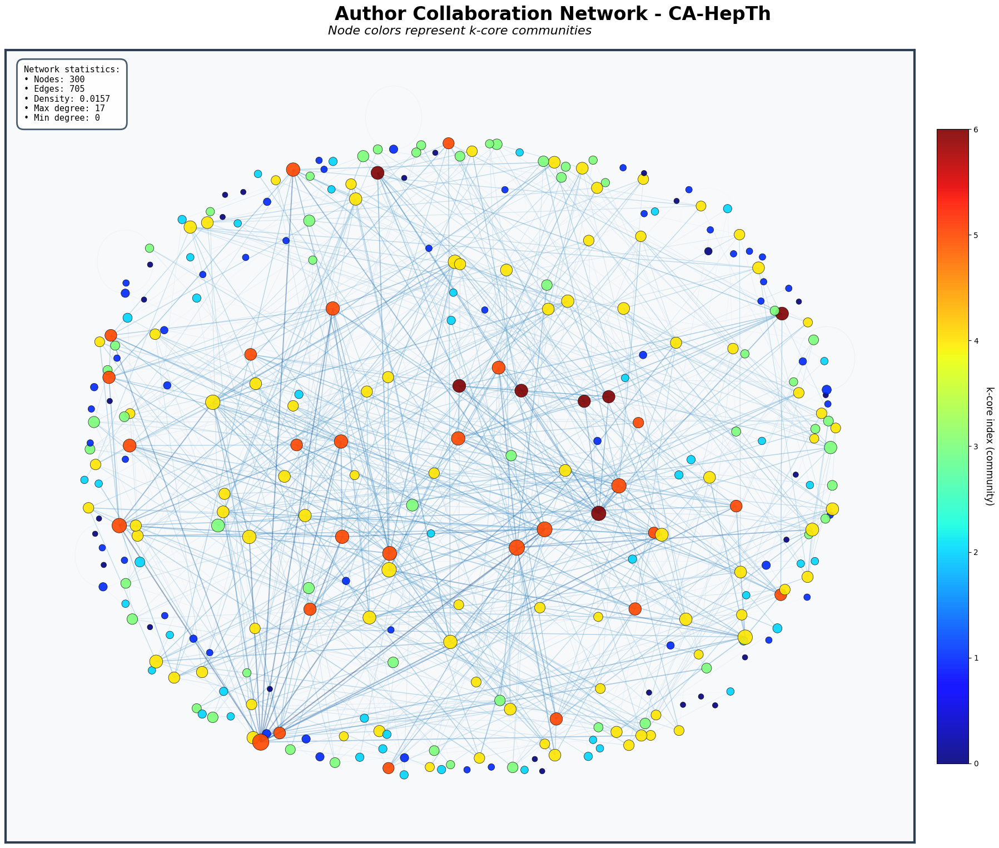

In [57]:
plot_collaboration_network_by_community(H_with_communities)

### k-clique communities (maximal cliques)

In [58]:
def add_kclique_communities(graph, k=3):
    """
    Add, for each node, the list of maximal cliques of size >= k it belongs to.

    Returns
    -------
    G_with_communities : networkx.Graph
        Copy of the graph with node attribute 'kclique_communities'
        (list of clique IDs).
    cliques_filtered : list[list]
        List of maximal cliques (as lists of nodes), filtered by size >= k.
    """
    G_with_communities = graph.copy()

    # Remove self-loops and find all maximal cliques
    G_clean = G_with_communities.copy()
    G_clean.remove_edges_from(nx.selfloop_edges(G_clean))
    all_cliques = list(nx.find_cliques(G_clean))

    # Keep only cliques of size >= k
    cliques_filtered = [c for c in all_cliques if len(c) >= k]

    # Initialize attribute on all nodes
    for node in G_with_communities.nodes():
        G_with_communities.nodes[node]["kclique_communities"] = []

    # Assign clique IDs
    for clique_id, clique in enumerate(cliques_filtered):
        for node in clique:
            G_with_communities.nodes[node]["kclique_communities"].append(clique_id)

    return G_with_communities, cliques_filtered

H_with_kcliques, cliques = add_kclique_communities(H, k=3)


In [59]:
def compute_node_properties_by_kclique(H, clique_id=None):
    """
    Node sizes = degree (as before),
    node colors based on k-clique membership.

    - If clique_id is None:
        color = number of maximal cliques the node belongs to.
    - Otherwise:
        color = 1 if node is in the selected clique, 0 otherwise.
    """
    _, node_sizes, max_degree, min_degree = compute_node_properties(H)

    if clique_id is None:
        node_colors = [
            len(H.nodes[n].get("kclique_communities", []))
            for n in H.nodes()
        ]
    else:
        node_colors = [
            1 if clique_id in H.nodes[n].get("kclique_communities", []) else 0
            for n in H.nodes()
        ]

    return node_colors, node_sizes, max_degree, min_degree


def draw_network_nodes_by_kclique(H, pos, ax, clique_id=None):
    """Draw nodes colored based on k-clique membership."""
    node_colors, node_sizes, max_degree, min_degree = compute_node_properties_by_kclique(
        H, clique_id=clique_id
    )
    nodes = nx.draw_networkx_nodes(
        H, pos,
        node_color=node_colors,
        node_size=node_sizes,
        cmap=plt.cm.jet,
        alpha=0.9,
        edgecolors="black",
        linewidths=0.5,
        ax=ax,
    )
    return nodes, max_degree, min_degree


def add_colorbar_kclique(nodes, ax, clique_id=None):
    """Colorbar for k-clique based coloring."""
    cbar = plt.colorbar(nodes, ax=ax, shrink=0.8, pad=0.02)
    if clique_id is None:
        cbar.set_label("Number of maximal cliques", rotation=270, labelpad=20, fontsize=12)
    else:
        cbar.set_label(f"Membership of clique #{clique_id}", rotation=270, labelpad=20, fontsize=12)
    return cbar


def plot_collaboration_network_by_kclique(H, figsize=(20, 16), clique_id=None):
    """
    Visualization where node colors represent:
    - either the number of maximal cliques per node (clique_id=None),
    - or membership in a specific clique (clique_id specified).
    """
    plt.style.use("default")
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, facecolor="#f8f9fa")

    pos = nx.spring_layout(H, seed=42, k=1.5, iterations=50)

    draw_network_edges(H, pos, ax)
    nodes, max_degree, min_degree = draw_network_nodes_by_kclique(H, pos, ax, clique_id=clique_id)

    add_titles_and_labels(fig, ax, subtitle="Node colors represent k-clique membership")
    add_colorbar_kclique(nodes, ax, clique_id=clique_id)
    add_decorative_frame(ax)
    add_statistics_box(H, max_degree, min_degree, ax)
    configure_axes(ax)

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

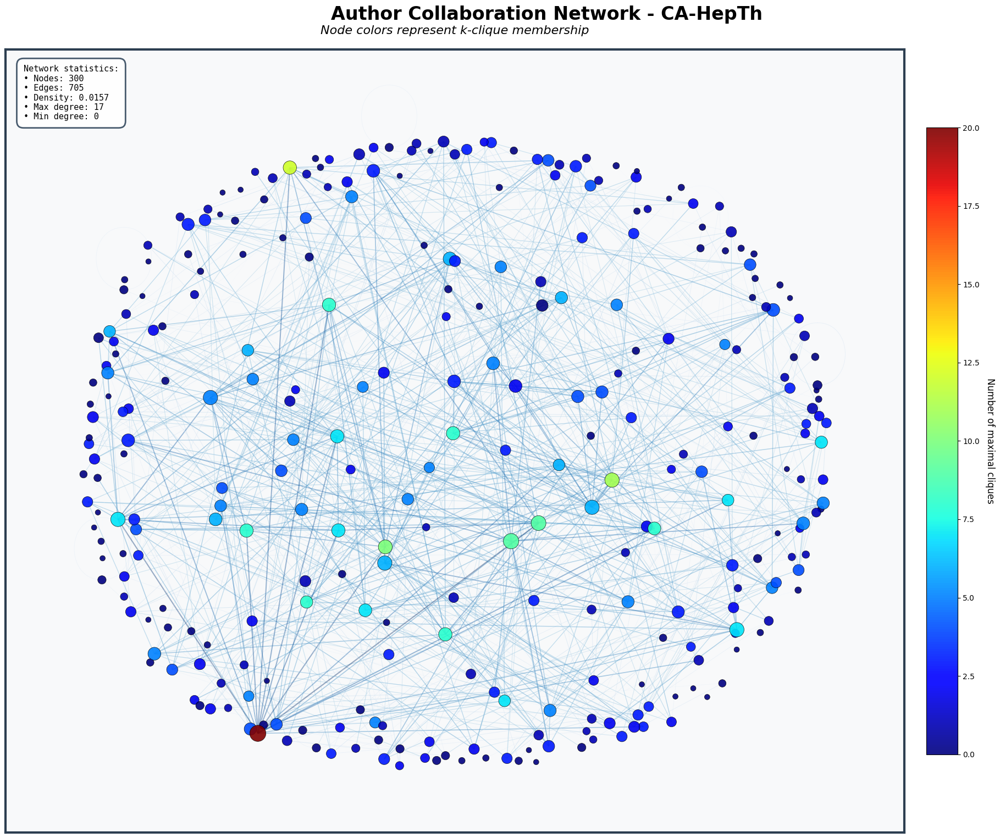

In [60]:
plot_collaboration_network_by_kclique(H_with_kcliques)

### Louvain communities

Louvain found 48 communities on H.


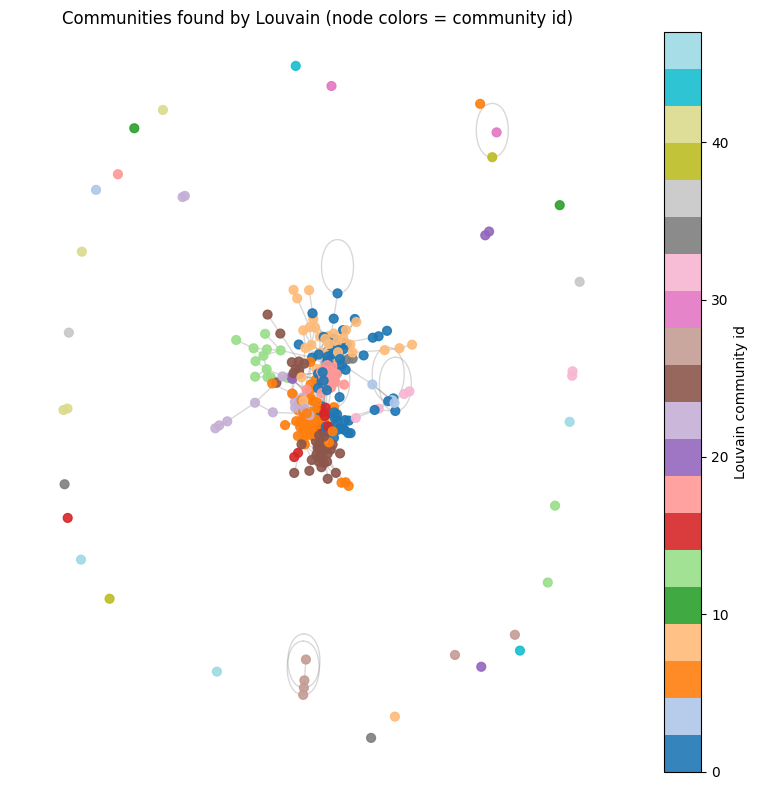

In [ ]:
# Louvain on H
H_louvain = H.copy()
part_louvain_H = community_louvain.best_partition(H_louvain)
nx.set_node_attributes(H_louvain, part_louvain_H, "louvain_comm")

print(f"Louvain found {len(set(part_louvain_H.values()))} communities on H.")


plt.figure(figsize=(8, 8))
pos = nx.spring_layout(H_louvain, seed=42)

node_colors = [H_louvain.nodes[n].get("louvain_comm", -1) for n in H_louvain.nodes()]
node_sizes = [40 for _ in H_louvain.nodes()]

nodes = nx.draw_networkx_nodes(
    H_louvain,
    pos,
    node_color=node_colors,
    node_size=node_sizes,
    cmap="tab20",
    alpha=0.9,
)
nx.draw_networkx_edges(H_louvain, pos, alpha=0.3, edge_color="gray")

plt.title("Communities found by Louvain (node colors = community id)")
plt.axis("off")
cbar = plt.colorbar(nodes)
cbar.set_label("Louvain community id")
plt.tight_layout()
plt.show()


### Walktrap communities

Walktrap found 62 communities on H.


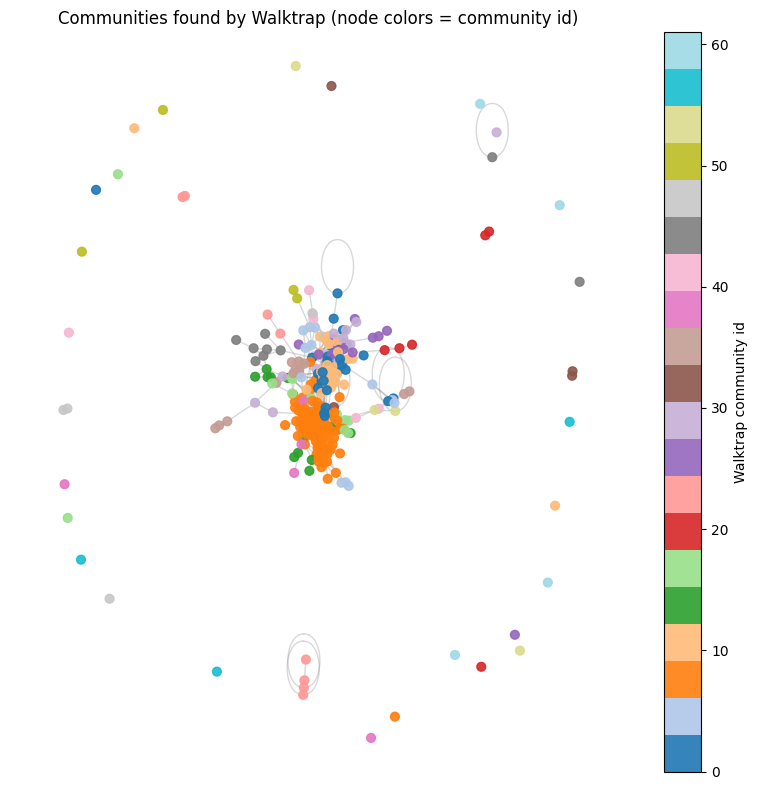

In [ ]:
# convert H to igraph
nodes_H = list(H.nodes())
id_map = {v: i for i, v in enumerate(nodes_H)}
edges_H = [(id_map[u], id_map[v]) for u, v in H.edges()]

g_H = ig.Graph()
g_H.add_vertices(len(nodes_H))
g_H.add_edges(edges_H)

walktrap = g_H.community_walktrap(steps=4)
clusters = walktrap.as_clustering()
membership = clusters.membership

part_walktrap_H = {nodes_H[i]: cid for i, cid in enumerate(membership)}
H_walktrap = H.copy()
nx.set_node_attributes(H_walktrap, part_walktrap_H, "walktrap_comm")

print(f"Walktrap found {len(set(part_walktrap_H.values()))} communities on H.")


plt.figure(figsize=(8, 8))
pos = nx.spring_layout(H_walktrap, seed=42)

node_colors = [H_walktrap.nodes[n].get("walktrap_comm", -1) for n in H_walktrap.nodes()]
node_sizes = [40 for _ in H_walktrap.nodes()]

nodes = nx.draw_networkx_nodes(
    H_walktrap,
    pos,
    node_color=node_colors,
    node_size=node_sizes,
    cmap="tab20",
    alpha=0.9,
)
nx.draw_networkx_edges(H_walktrap, pos, alpha=0.3, edge_color="gray")

plt.title("Communities found by Walktrap (node colors = community id)")
plt.axis("off")
cbar = plt.colorbar(nodes)
cbar.set_label("Walktrap community id")
plt.tight_layout()
plt.show()


<div style="background-color: #f2eec7ff; border: 2px solid #baaf5bff; border-radius: 10px; padding: 15px; margin: 10px 0;">
<h4 style="color: #baaf5bff; margin-top: 0;">Note</h4>

- k-core communities emphasize **global structural robustness**:
  authors that stay in the graph even when low-degree nodes are removed.
- k-clique communities emphasize **local dense collaboration patterns**:
  tightly knit teams and overlapping research groups.
- Louvain emphasizes global modular structure:
    it finds a partition that maximises modularity, i.e. groups of products with
      many edges inside the group and relatively few edges going outside. This gives
      a clear high-level segmentation of the Amazon network into large communities
- Walktrap emphasizes random-walk similarity:
      products that a random walker tends to stay around are grouped together.
      This often leads to slightly different community shapes (sometimes larger,
      sometimes more unbalanced) compared to Louvain.
Combining all views gives a nuanced picture of the hep-th ecosystem:
who forms the backbone, and where the tight clusters of collaboration live.
</div>